In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [5]:
import torch
from IPython.display import clear_output

In [6]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 5

In [7]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [8]:
# NAME       = 'D1a1'
# MODELNAME  = NAME + '_' + str(seed) + '.pt'

In [9]:
# !jupyter nbconvert --output-dir='./py_scripts' --to script D1a1.ipynb

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] < tot_day_radiation <= bin_edges[k]):
                day_state = k -1
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True
                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.95*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the mean battery level for each day
        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels

        self.enp = self.BOPT - self.batt
#         self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        reward = 0
        
        sharpness = 15
        reward += 2 - 3/ (1 + np.exp(-sharpness*(np.abs(self.enp) - self.ENP_MARGIN/2)/self.BMAX))
                
        if(self.day_violation_flag):
            violation_penalty += 3    #penalty for violating battery limits anytime during the day
        
        return (reward - violation_penalty)
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
            reward -= 2
            if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
                reward -= 2
            
        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels

        
        #proceed to the next time step
        self.enp = self.BOPT - self.batt
        
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9               # greedy policy
GAMMA               = 0.9                 # reward discount
LAMBDA              = 0.95                # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18    # target update frequency (every two months)
MEMORY_CAPACITY     = 24*7*4*12*2      # store upto six month worth of memory   

N_ACTIONS           = 10 #no. of duty cycles (0,1,2,3,4)
N_STATES            = 4 #number of state space parameter [batt, enp, henergy, fcast]


HIDDEN_LAYER        = 50
NO_OF_ITERATIONS    = 100
GPU                 = False
HELP                = 0.05

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
#         nn.init.kaiming_uniform_(self.fc1.weight)
        self.fc1.weight.data.normal_(0, 0.01)

#         self.fc2 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         nn.init.kaiming_uniform_(self.fc2.weight)
        
#         self.fc3 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         nn.init.kaiming_uniform_(self.fc3.weight)

        self.fc_out = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
#         nn.init.xavier_uniform_(self.fc_out.weight) 
        self.fc_out.weight.data.normal_(0, 0.01)

    
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)
#         x = F.leaky_relu(x)
#         x = self.fc2(x)
#         x = F.relu(x)
#         x = self.fc3(x)
#         x = F.relu(x)
        x = self.fc_out(x)
        return x
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device
#         print("Neural net")
#         print(self.eval_net)
        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
#         self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR, weight_decay=WT_DECAY)
#         self.loss_func = nn.SmoothL1Loss()
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if np.random.uniform() < EPSILON:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        else:   # random
            action = np.random.randint(0, N_ACTIONS)
            action = action
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if True:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        q_next = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.max(1)[0].view(BATCH_SIZE, 1)   # shape (batch, 1)
        loss = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

In [14]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.15
    
    MU_ENP = 0
    SD_ENP = 0.15
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.25
    
    MU_FCAST = 0.42
    SD_FCAST = 0.27
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]


Device:  cpu

Iteration 0:  TOKYO, 2009 
EPSILON = 7.619e-01
LR = 3.392e-05
Average Terminal Reward  = -7.541
Day Violations           =    365
Battery Limit Violations =   5079
Action MEAN              =  6.667
Action STD DEV           =  1.494


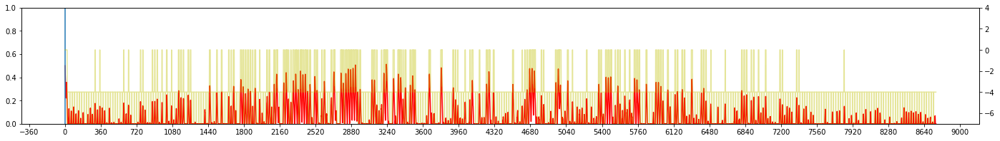

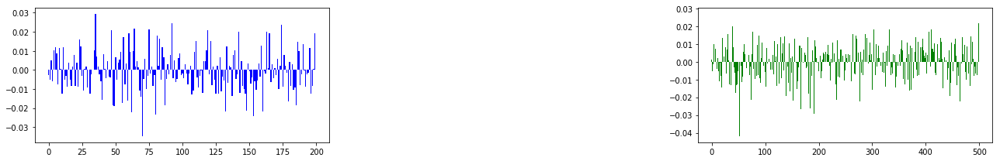


Iteration 1:  TOKYO, 2006 
EPSILON = 7.630e-01
LR = 4.174e-05
Average Terminal Reward  = -7.235
Day Violations           =    348
Battery Limit Violations =   4860
Action MEAN              =  6.187
Action STD DEV           =  2.164


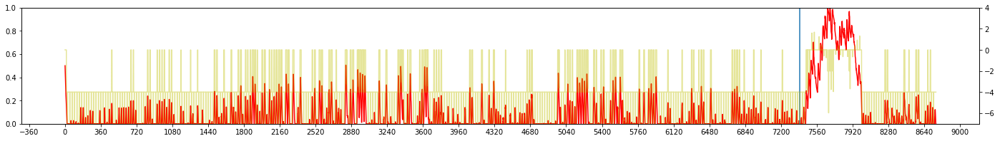

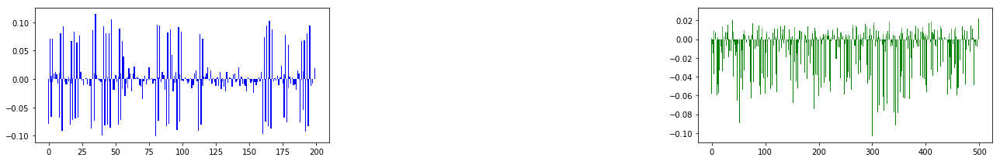


Iteration 2:  TOKYO, 2003 
EPSILON = 7.643e-01
LR = 5.000e-05
Average Terminal Reward  = -3.347
Day Violations           =    218
Battery Limit Violations =   1496
Action MEAN              =  3.596
Action STD DEV           =  2.655


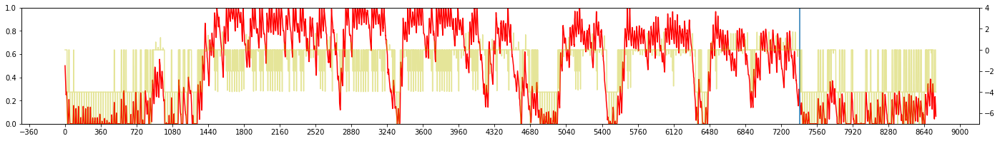

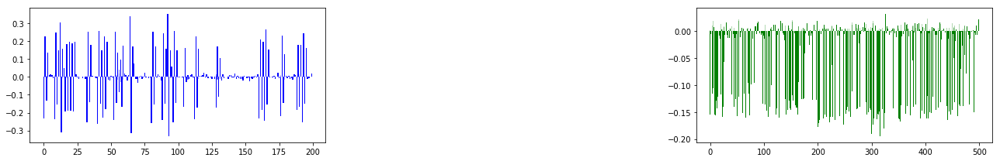


Iteration 3:  TOKYO, 2003 
EPSILON = 7.657e-01
LR = 5.826e-05
Average Terminal Reward  = -2.333
Day Violations           =    162
Battery Limit Violations =    981
Action MEAN              =  3.493
Action STD DEV           =  2.683


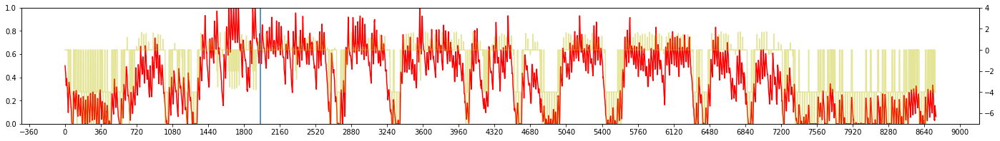

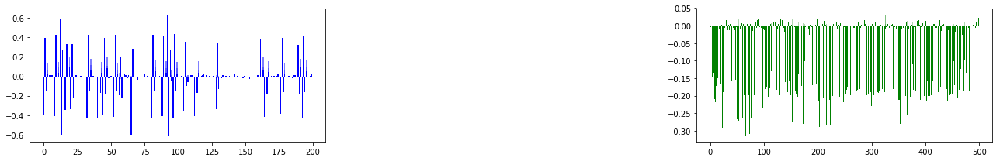


Iteration 4:  TOKYO, 2002 
EPSILON = 7.673e-01
LR = 6.608e-05
Average Terminal Reward  = -1.986
Day Violations           =    148
Battery Limit Violations =   1052
Action MEAN              =  3.759
Action STD DEV           =  2.927


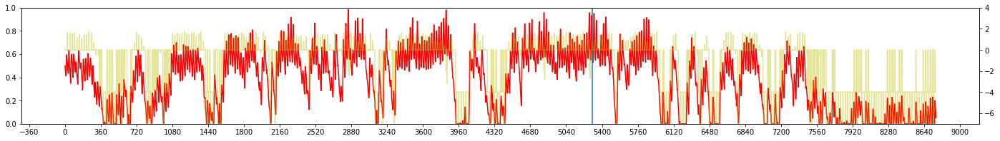

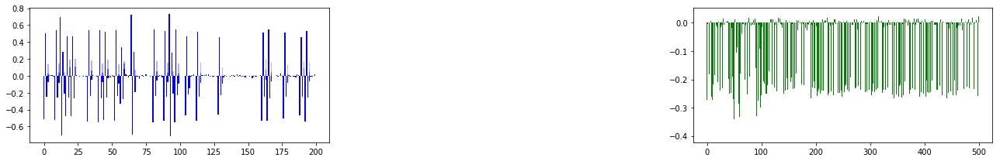


Iteration 5:  TOKYO, 2000 
EPSILON = 7.690e-01
LR = 7.311e-05
Average Terminal Reward  = -1.506
Day Violations           =    132
Battery Limit Violations =    613
Action MEAN              =  3.606
Action STD DEV           =  3.037


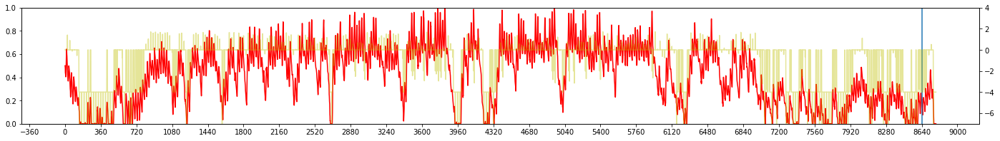

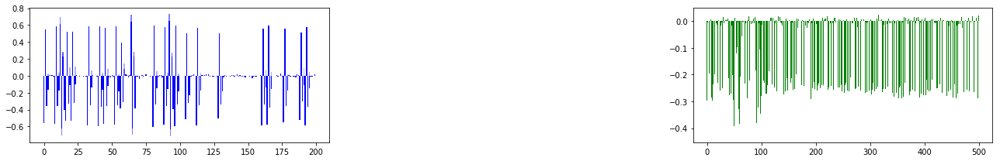


Iteration 6:  TOKYO, 2003 
EPSILON = 7.708e-01
LR = 7.914e-05
Average Terminal Reward  = -1.833
Day Violations           =    136
Battery Limit Violations =    544
Action MEAN              =  3.335
Action STD DEV           =  2.828


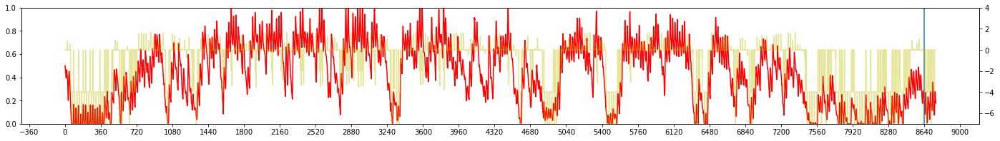

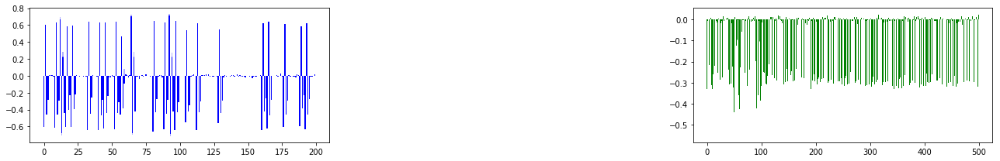


Iteration 7:  TOKYO, 2007 
EPSILON = 7.728e-01
LR = 8.411e-05
Average Terminal Reward  = -2.182
Day Violations           =    169
Battery Limit Violations =    610
Action MEAN              =  3.571
Action STD DEV           =  2.746


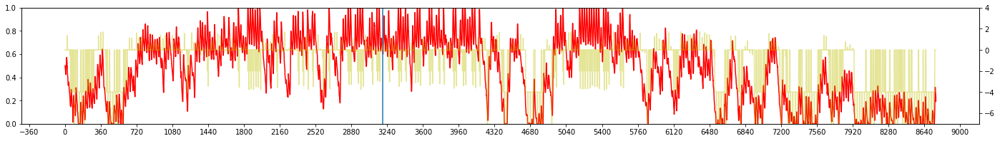

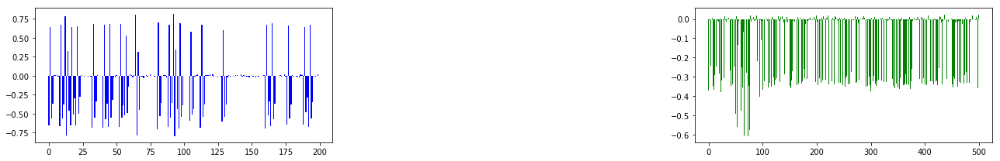


Iteration 8:  TOKYO, 2002 
EPSILON = 7.749e-01
LR = 8.808e-05
Average Terminal Reward  = -1.756
Day Violations           =    139
Battery Limit Violations =    527
Action MEAN              =  3.551
Action STD DEV           =  3.033


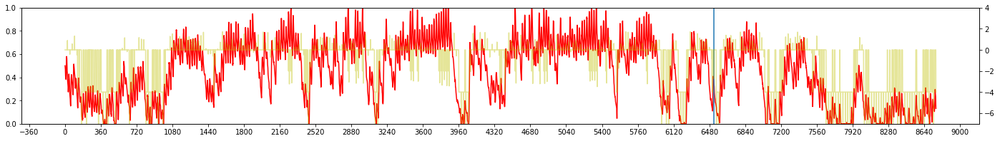

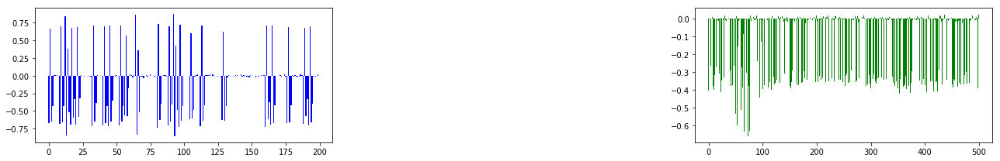


Iteration 9:  TOKYO, 2005 
EPSILON = 7.773e-01
LR = 9.116e-05
Average Terminal Reward  = -0.827
Day Violations           =     92
Battery Limit Violations =    225
Action MEAN              =  3.493
Action STD DEV           =  2.921


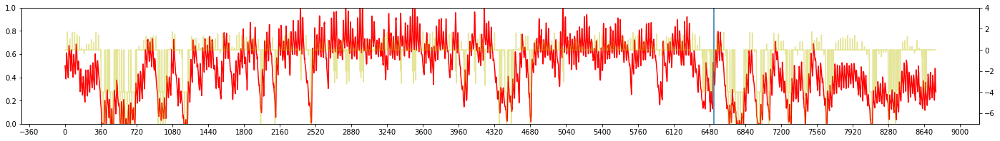

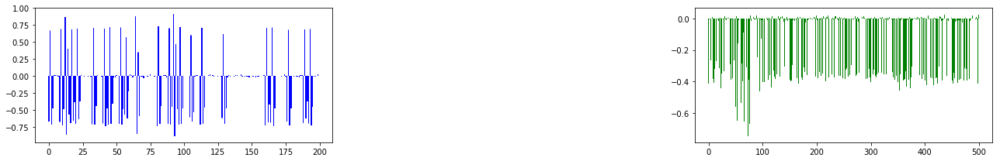


Iteration 10:  TOKYO, 2002 
EPSILON = 7.798e-01
LR = 9.350e-05
Average Terminal Reward  = -1.792
Day Violations           =    139
Battery Limit Violations =    730
Action MEAN              =  3.658
Action STD DEV           =  2.986


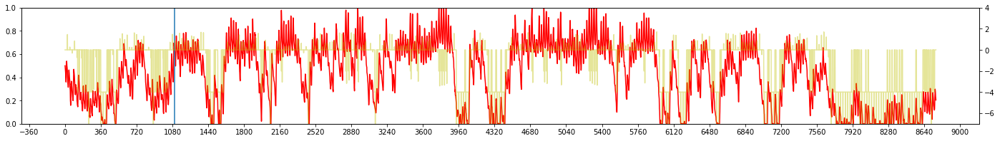

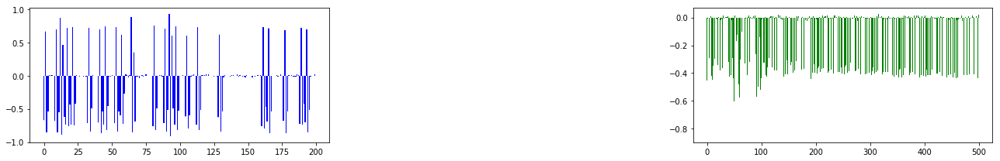


Iteration 11:  TOKYO, 2004 
EPSILON = 7.825e-01
LR = 9.526e-05
Average Terminal Reward  = -1.475
Day Violations           =    125
Battery Limit Violations =    496
Action MEAN              =  3.754
Action STD DEV           =  3.111


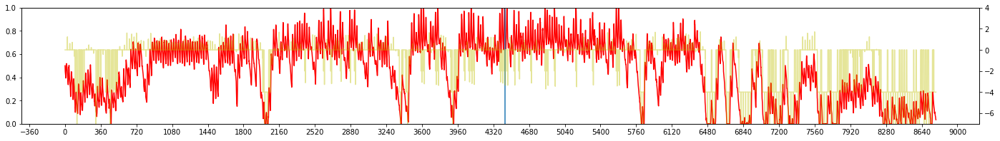

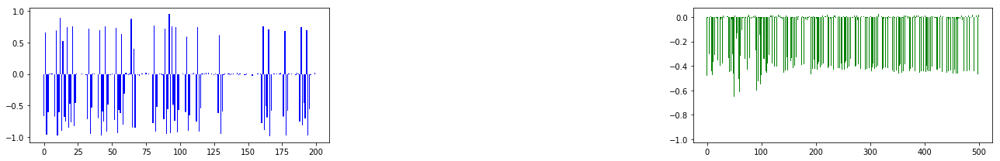


Iteration 12:  TOKYO, 2006 
EPSILON = 7.855e-01
LR = 9.656e-05
Average Terminal Reward  = -2.271
Day Violations           =    155
Battery Limit Violations =   1054
Action MEAN              =  3.497
Action STD DEV           =  2.699


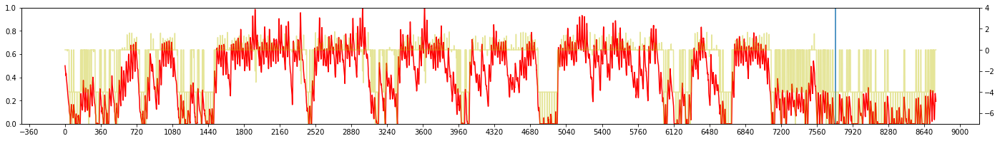

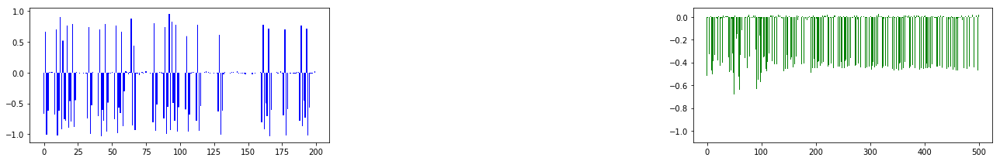


Iteration 13:  TOKYO, 2003 
EPSILON = 7.886e-01
LR = 9.751e-05
Average Terminal Reward  = -2.037
Day Violations           =    151
Battery Limit Violations =    685
Action MEAN              =  3.369
Action STD DEV           =  2.707


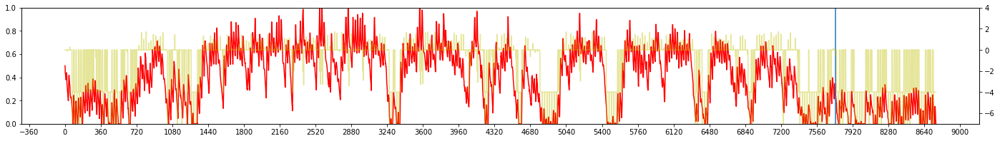

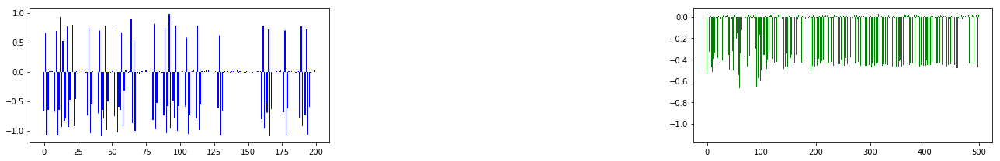


Iteration 14:  TOKYO, 2003 
EPSILON = 7.920e-01
LR = 9.820e-05
Average Terminal Reward  = -1.625
Day Violations           =    131
Battery Limit Violations =    600
Action MEAN              =  3.374
Action STD DEV           =  2.701


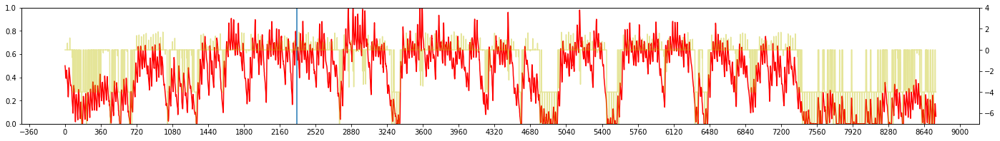

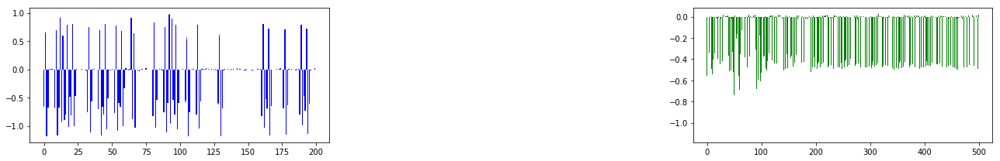


Iteration 15:  TOKYO, 2006 
EPSILON = 7.956e-01
LR = 9.870e-05
Average Terminal Reward  = -2.044
Day Violations           =    150
Battery Limit Violations =    918
Action MEAN              =  3.384
Action STD DEV           =  2.610


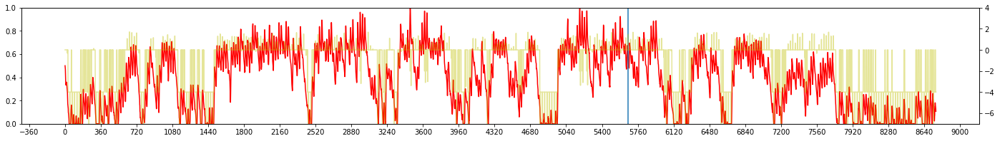

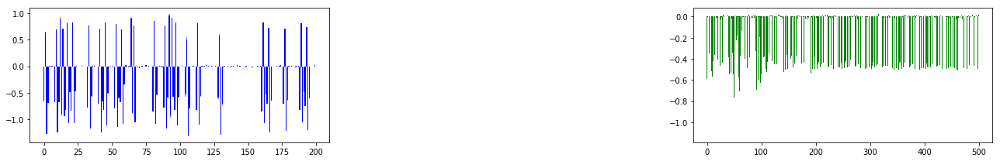


Iteration 16:  TOKYO, 2002 
EPSILON = 7.995e-01
LR = 9.907e-05
Average Terminal Reward  = -1.553
Day Violations           =    119
Battery Limit Violations =    878
Action MEAN              =  3.750
Action STD DEV           =  2.925


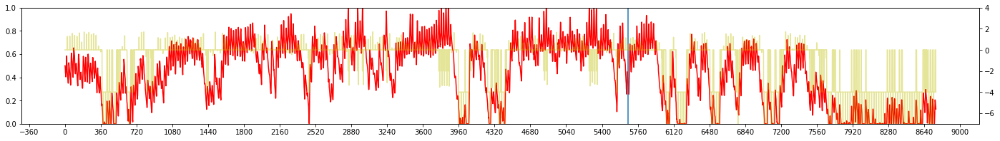

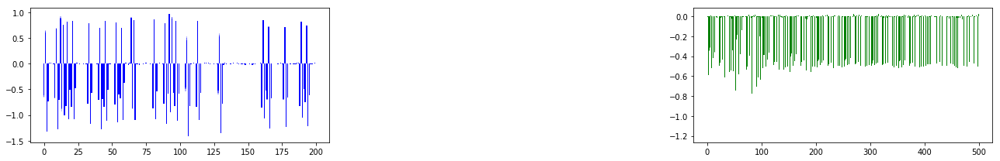


Iteration 17:  TOKYO, 2000 
EPSILON = 8.035e-01
LR = 9.933e-05
Average Terminal Reward  = -1.905
Day Violations           =    144
Battery Limit Violations =    603
Action MEAN              =  3.577
Action STD DEV           =  3.039


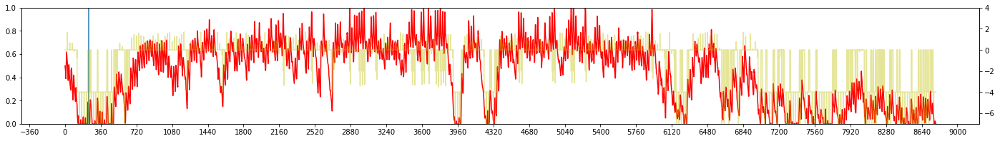

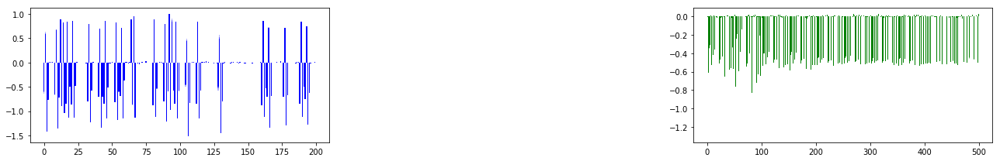


Iteration 18:  TOKYO, 2001 
EPSILON = 8.079e-01
LR = 9.952e-05
Average Terminal Reward  = -1.431
Day Violations           =    136
Battery Limit Violations =    381
Action MEAN              =  3.472
Action STD DEV           =  2.888


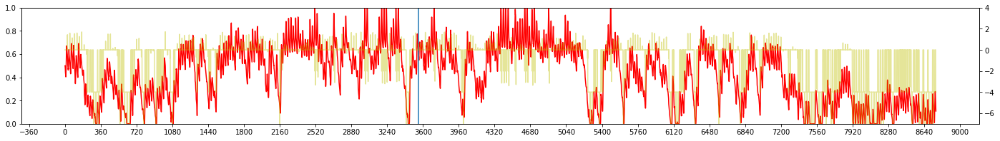

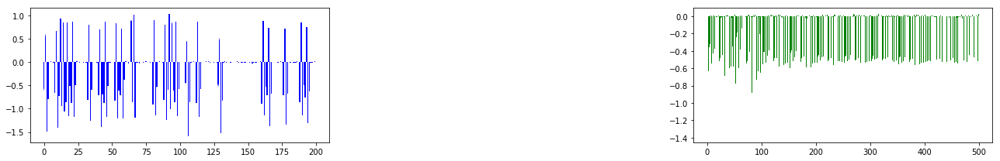


Iteration 19:  TOKYO, 2003 
EPSILON = 8.124e-01
LR = 9.966e-05
Average Terminal Reward  = -1.384
Day Violations           =    119
Battery Limit Violations =    469
Action MEAN              =  3.264
Action STD DEV           =  2.762


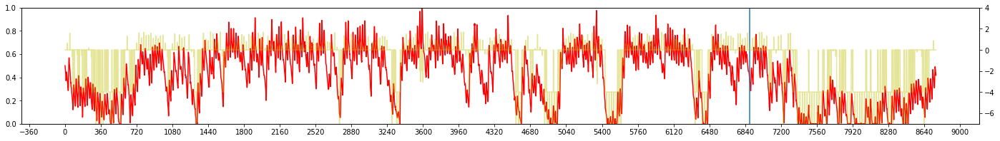

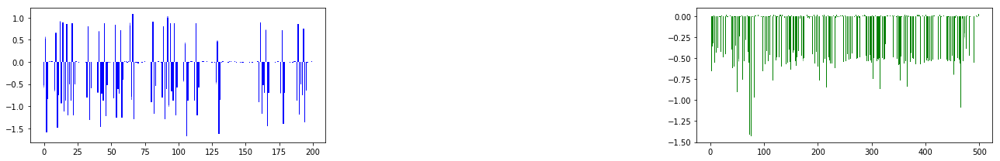


Iteration 20:  TOKYO, 2005 
EPSILON = 8.172e-01
LR = 9.975e-05
Average Terminal Reward  = -0.455
Day Violations           =     71
Battery Limit Violations =    235
Action MEAN              =  3.492
Action STD DEV           =  2.880


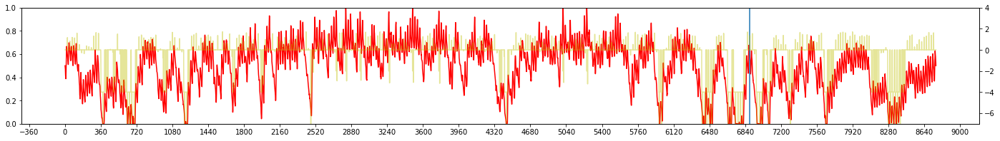

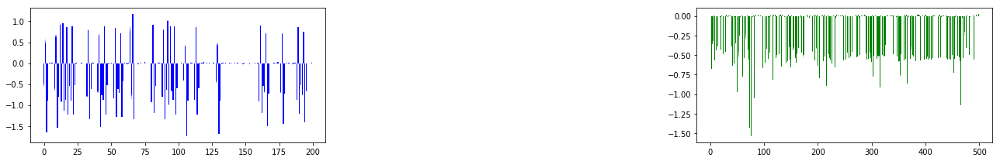


Iteration 21:  TOKYO, 2007 
EPSILON = 8.223e-01
LR = 9.982e-05
Average Terminal Reward  = -1.348
Day Violations           =    116
Battery Limit Violations =    410
Action MEAN              =  3.624
Action STD DEV           =  2.992


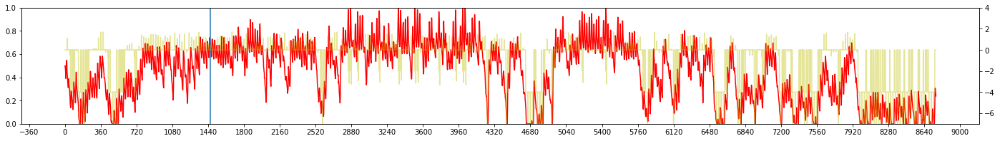

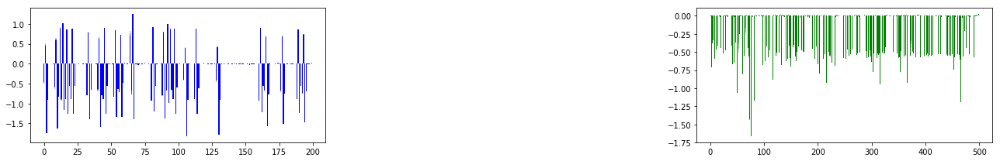


Iteration 22:  TOKYO, 2003 
EPSILON = 8.275e-01
LR = 9.987e-05
Average Terminal Reward  = -1.229
Day Violations           =    111
Battery Limit Violations =    539
Action MEAN              =  3.369
Action STD DEV           =  2.745


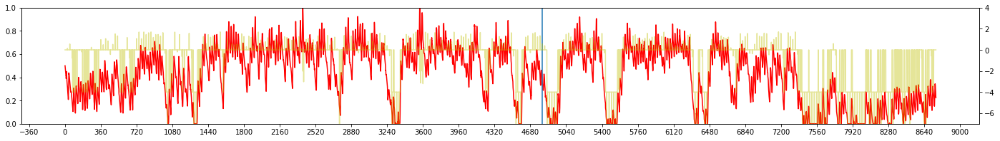

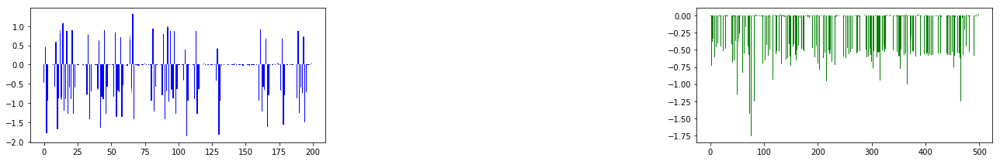


Iteration 23:  TOKYO, 2005 
EPSILON = 8.330e-01
LR = 9.991e-05
Average Terminal Reward  = -0.728
Day Violations           =     86
Battery Limit Violations =    328
Action MEAN              =  3.538
Action STD DEV           =  2.874


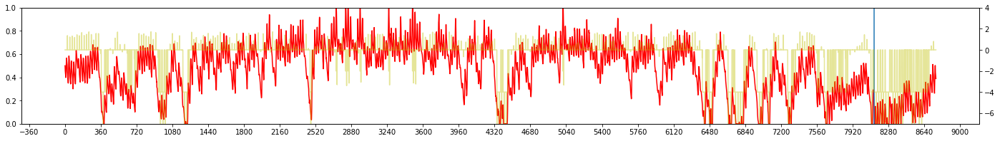

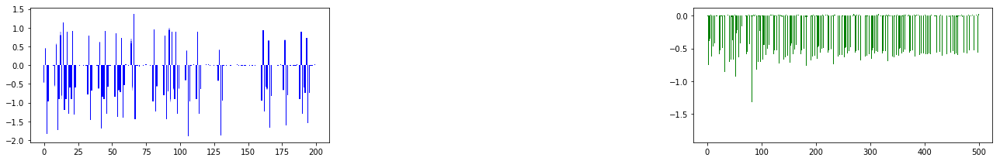


Iteration 24:  TOKYO, 2003 
EPSILON = 8.386e-01
LR = 9.993e-05
Average Terminal Reward  = -1.371
Day Violations           =    111
Battery Limit Violations =    515
Action MEAN              =  3.335
Action STD DEV           =  2.770


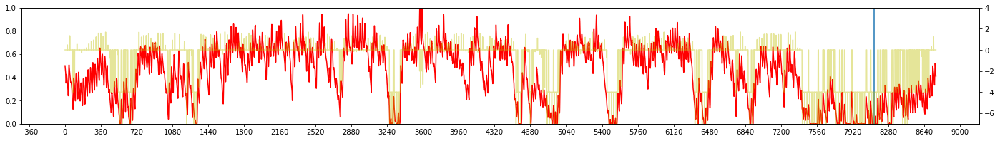

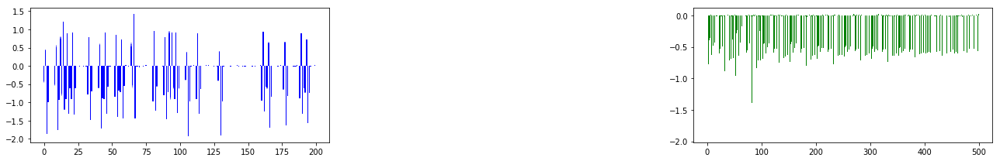


Iteration 25:  TOKYO, 2002 
EPSILON = 8.444e-01
LR = 9.995e-05
Average Terminal Reward  = -1.330
Day Violations           =    124
Battery Limit Violations =    575
Action MEAN              =  3.519
Action STD DEV           =  2.978


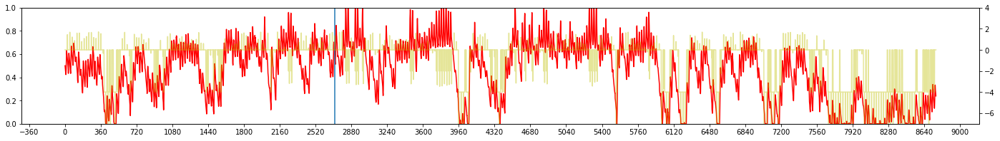

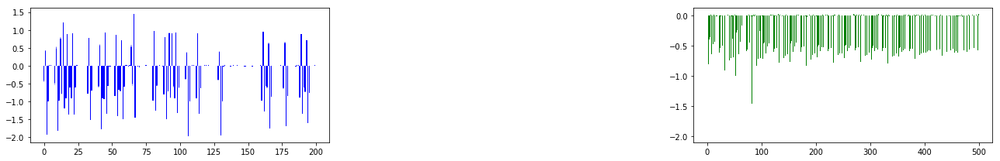


Iteration 26:  TOKYO, 2008 
EPSILON = 8.503e-01
LR = 9.997e-05
Average Terminal Reward  = -0.904
Day Violations           =     92
Battery Limit Violations =    354
Action MEAN              =  3.499
Action STD DEV           =  2.873


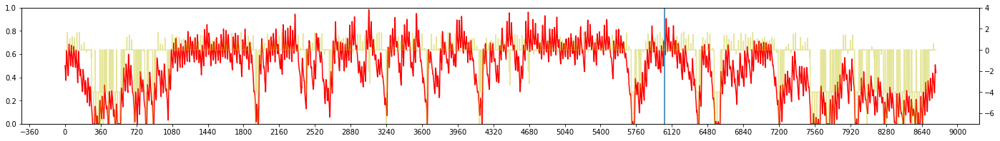

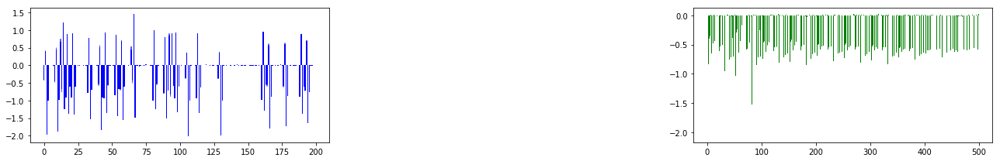


Iteration 27:  TOKYO, 2007 
EPSILON = 8.564e-01
LR = 9.998e-05
Average Terminal Reward  = -1.131
Day Violations           =    109
Battery Limit Violations =    421
Action MEAN              =  3.599
Action STD DEV           =  2.927


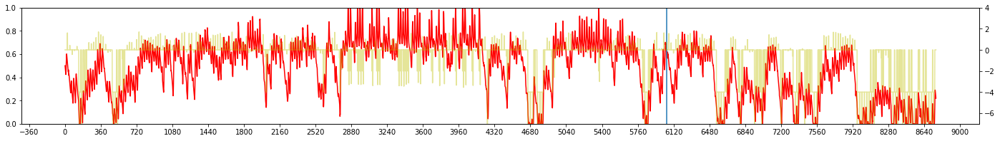

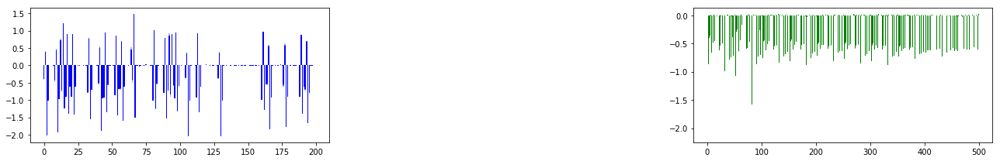


Iteration 28:  TOKYO, 2003 
EPSILON = 8.625e-01
LR = 9.998e-05
Average Terminal Reward  = -1.023
Day Violations           =     98
Battery Limit Violations =    459
Action MEAN              =  3.353
Action STD DEV           =  2.739


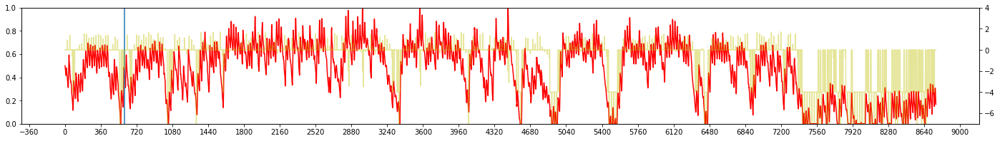

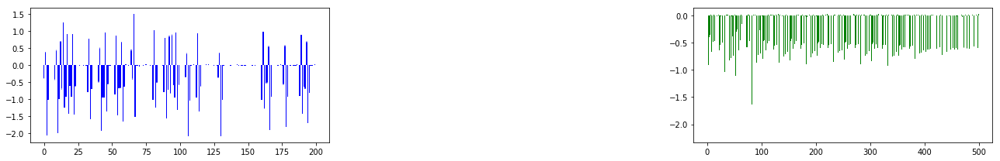


Iteration 29:  TOKYO, 2000 
EPSILON = 8.688e-01
LR = 9.999e-05
Average Terminal Reward  = -1.589
Day Violations           =    125
Battery Limit Violations =    497
Action MEAN              =  3.528
Action STD DEV           =  2.919


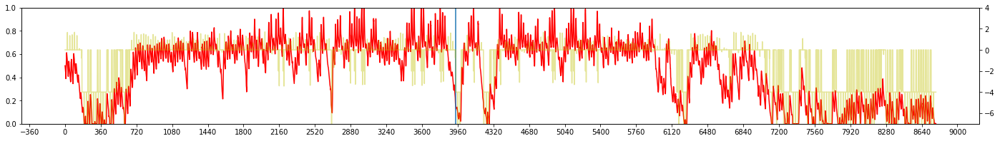

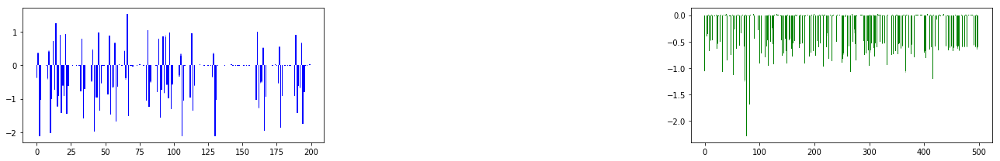


Iteration 30:  TOKYO, 2003 
EPSILON = 8.750e-01
LR = 9.999e-05
Average Terminal Reward  = -0.823
Day Violations           =     90
Battery Limit Violations =    508
Action MEAN              =  3.436
Action STD DEV           =  2.784


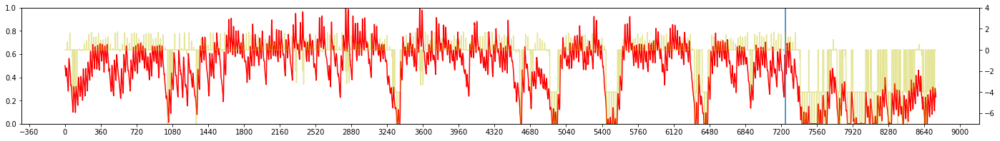

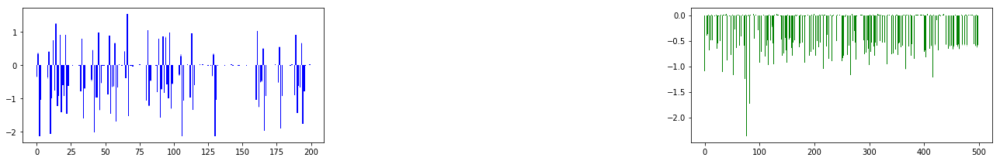


Iteration 31:  TOKYO, 2002 
EPSILON = 8.812e-01
LR = 8.749e-05
Average Terminal Reward  = -0.819
Day Violations           =     90
Battery Limit Violations =    534
Action MEAN              =  3.629
Action STD DEV           =  3.011


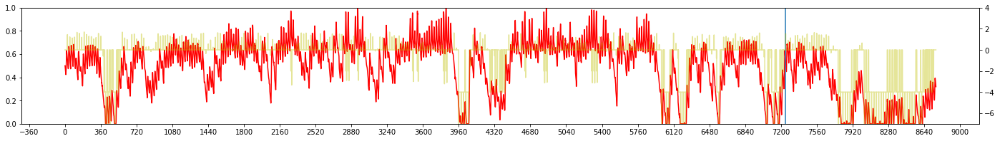

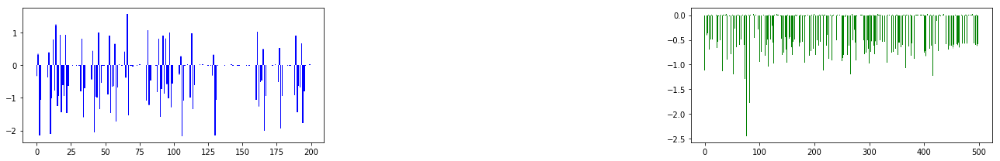


Iteration 32:  TOKYO, 2009 
EPSILON = 8.875e-01
LR = 7.681e-05
Average Terminal Reward  = -0.565
Day Violations           =     78
Battery Limit Violations =    410
Action MEAN              =  3.501
Action STD DEV           =  2.754


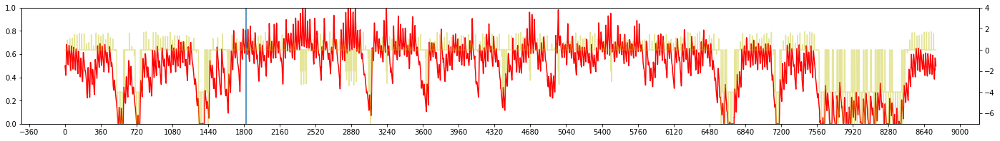

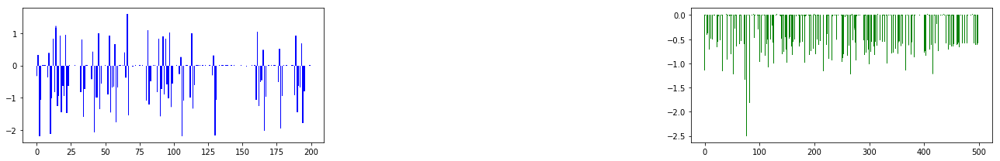


Iteration 33:  TOKYO, 2003 
EPSILON = 8.936e-01
LR = 6.767e-05
Average Terminal Reward  = -0.619
Day Violations           =     77
Battery Limit Violations =    336
Action MEAN              =  3.240
Action STD DEV           =  2.631


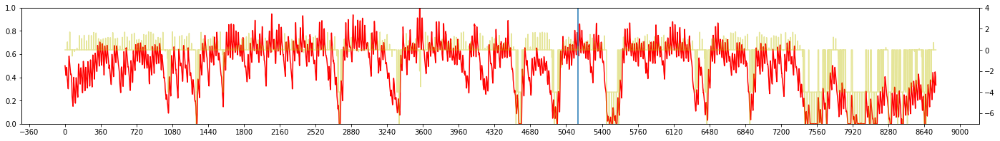

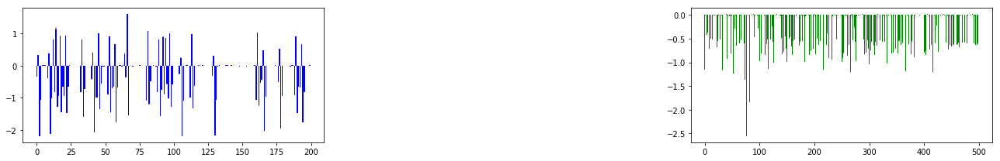


Iteration 34:  TOKYO, 2005 
EPSILON = 8.997e-01
LR = 5.986e-05
Average Terminal Reward  =  0.206
Day Violations           =     35
Battery Limit Violations =    129
Action MEAN              =  3.468
Action STD DEV           =  2.639


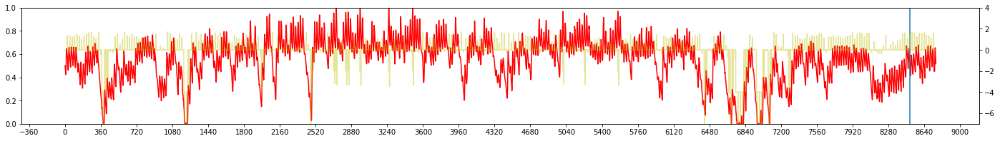

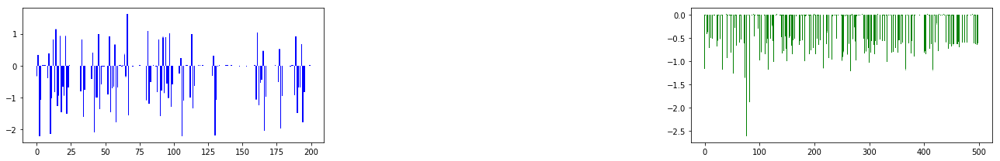


Iteration 35:  TOKYO, 2007 
EPSILON = 9.056e-01
LR = 5.318e-05
Average Terminal Reward  = -0.353
Day Violations           =     63
Battery Limit Violations =    259
Action MEAN              =  3.589
Action STD DEV           =  2.835


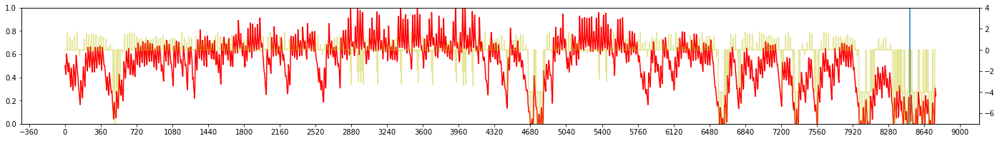

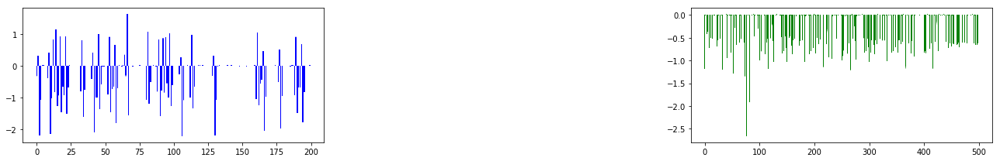


Iteration 36:  TOKYO, 2008 
EPSILON = 9.114e-01
LR = 4.747e-05
Average Terminal Reward  =  0.026
Day Violations           =     43
Battery Limit Violations =     80
Action MEAN              =  3.380
Action STD DEV           =  2.720


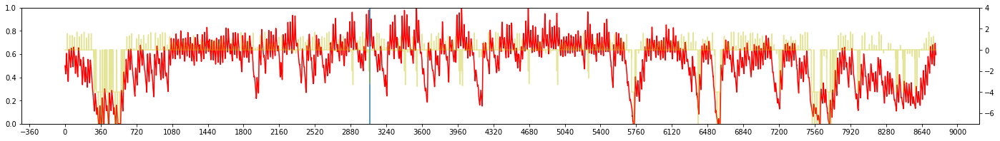

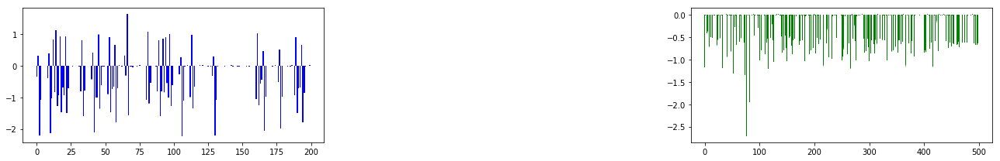


Iteration 37:  TOKYO, 2007 
EPSILON = 9.170e-01
LR = 4.258e-05
Average Terminal Reward  = -0.499
Day Violations           =     79
Battery Limit Violations =    138
Action MEAN              =  3.508
Action STD DEV           =  2.798


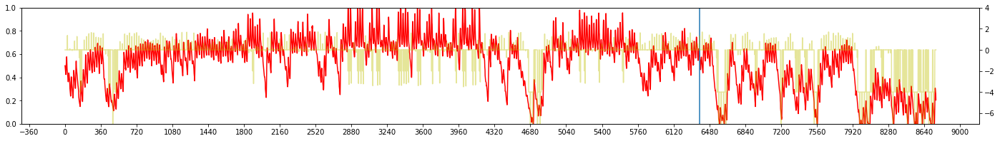

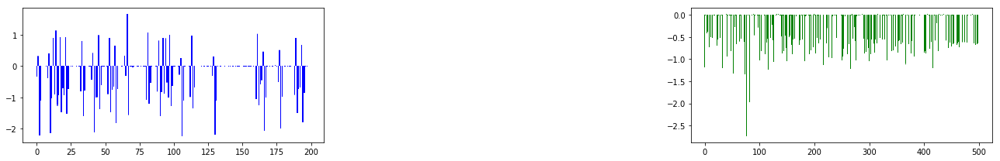


Iteration 38:  TOKYO, 2008 
EPSILON = 9.225e-01
LR = 3.841e-05
Average Terminal Reward  = -0.264
Day Violations           =     65
Battery Limit Violations =    100
Action MEAN              =  3.386
Action STD DEV           =  2.764


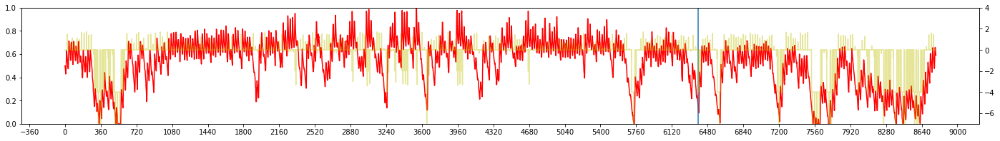

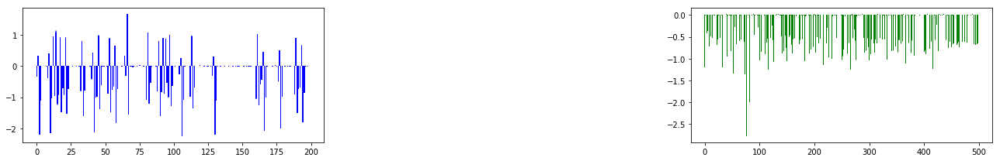


Iteration 39:  TOKYO, 2009 
EPSILON = 9.277e-01
LR = 3.484e-05
Average Terminal Reward  = -0.403
Day Violations           =     72
Battery Limit Violations =    295
Action MEAN              =  3.439
Action STD DEV           =  2.776


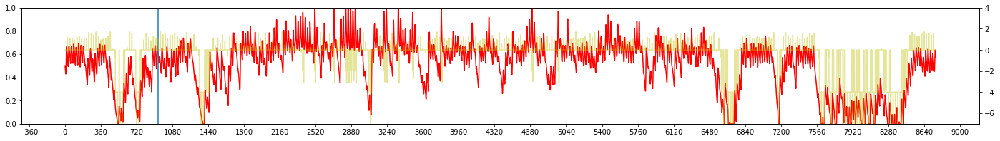

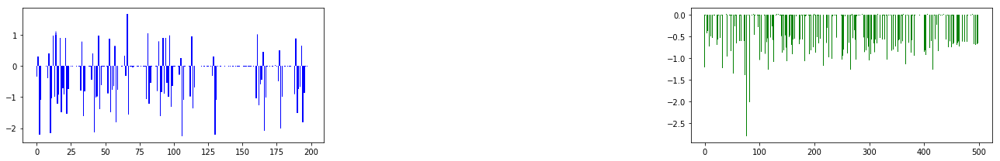


Iteration 40:  TOKYO, 2005 
EPSILON = 9.328e-01
LR = 3.179e-05
Average Terminal Reward  =  0.415
Day Violations           =     26
Battery Limit Violations =     84
Action MEAN              =  3.437
Action STD DEV           =  2.758


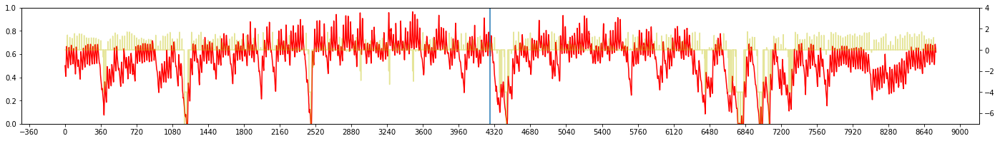

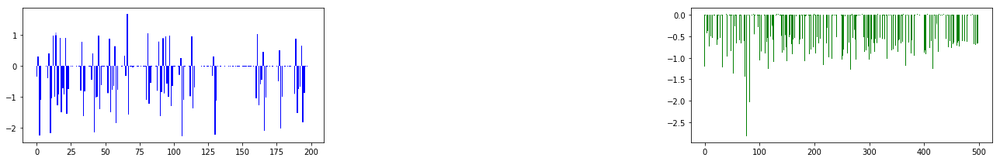


Iteration 41:  TOKYO, 2001 
EPSILON = 9.376e-01
LR = 2.918e-05
Average Terminal Reward  =  0.174
Day Violations           =     42
Battery Limit Violations =     30
Action MEAN              =  3.402
Action STD DEV           =  2.703


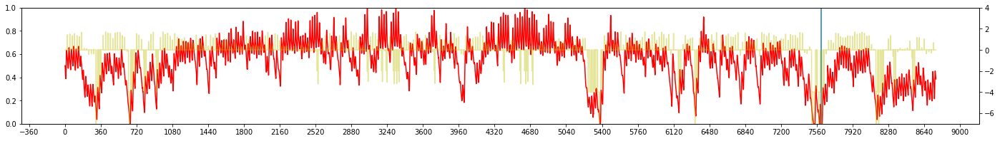

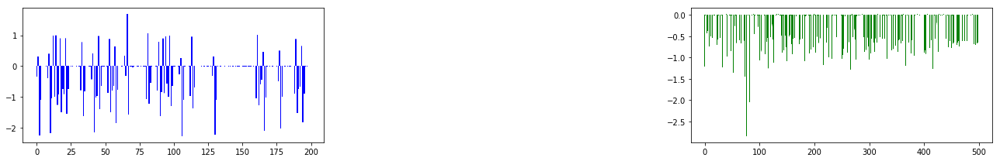


Iteration 42:  TOKYO, 2006 
EPSILON = 9.421e-01
LR = 2.695e-05
Average Terminal Reward  = -0.529
Day Violations           =     74
Battery Limit Violations =    325
Action MEAN              =  3.177
Action STD DEV           =  2.477


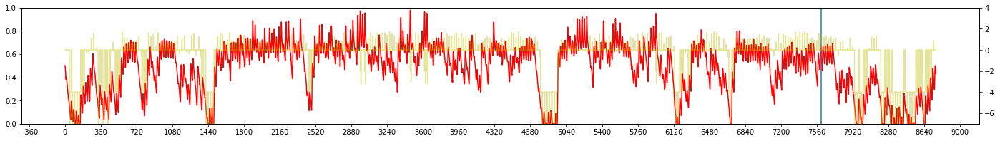

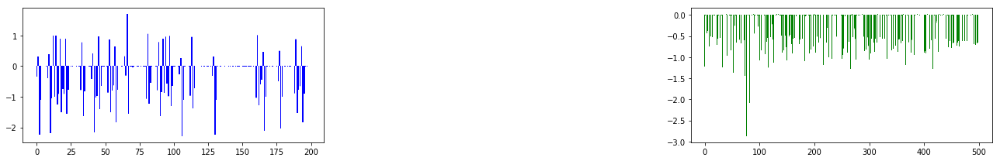


Iteration 43:  TOKYO, 2006 
EPSILON = 9.465e-01
LR = 2.504e-05
Average Terminal Reward  = -0.577
Day Violations           =     75
Battery Limit Violations =    282
Action MEAN              =  3.105
Action STD DEV           =  2.518


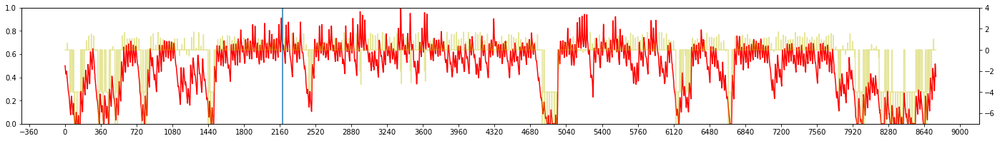

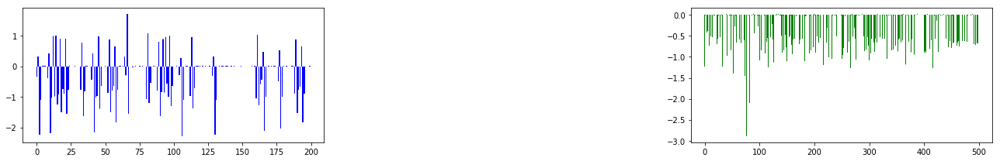


Iteration 44:  TOKYO, 2009 
EPSILON = 9.505e-01
LR = 2.341e-05
Average Terminal Reward  = -0.249
Day Violations           =     57
Battery Limit Violations =    232
Action MEAN              =  3.464
Action STD DEV           =  2.780


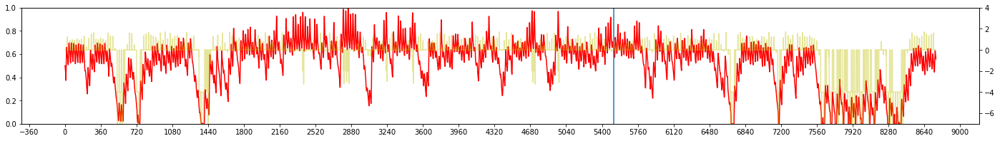

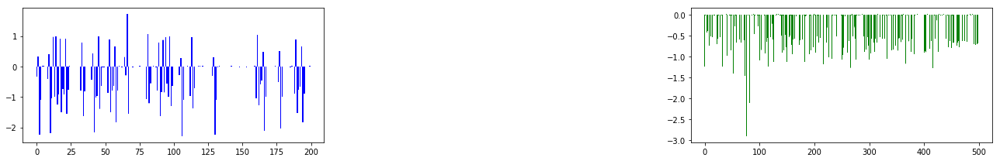


Iteration 45:  TOKYO, 2006 
EPSILON = 9.544e-01
LR = 2.202e-05
Average Terminal Reward  = -0.546
Day Violations           =     73
Battery Limit Violations =    324
Action MEAN              =  3.244
Action STD DEV           =  2.608


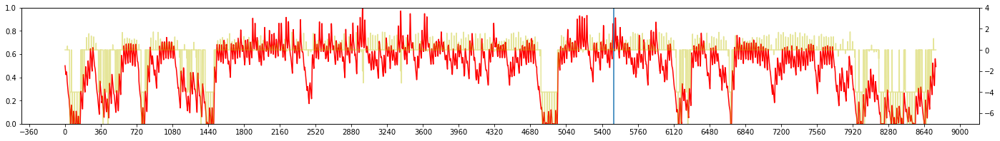

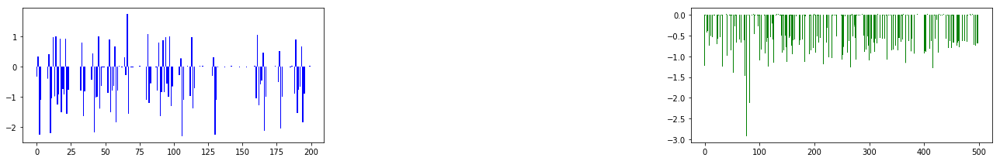


Iteration 46:  TOKYO, 2007 
EPSILON = 9.580e-01
LR = 2.082e-05
Average Terminal Reward  =  0.095
Day Violations           =     42
Battery Limit Violations =     74
Action MEAN              =  3.522
Action STD DEV           =  2.893


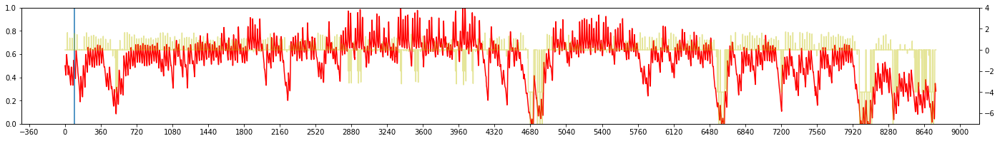

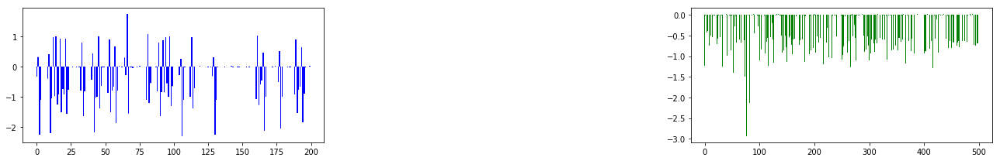


Iteration 47:  TOKYO, 2003 
EPSILON = 9.614e-01
LR = 1.980e-05
Average Terminal Reward  =  0.138
Day Violations           =     38
Battery Limit Violations =    215
Action MEAN              =  3.199
Action STD DEV           =  2.604


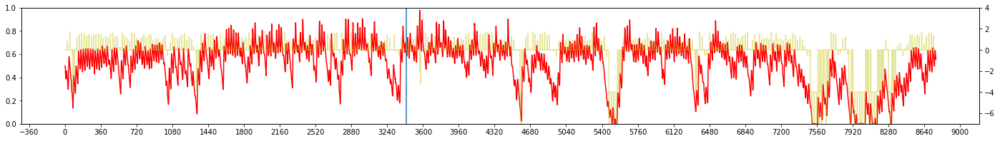

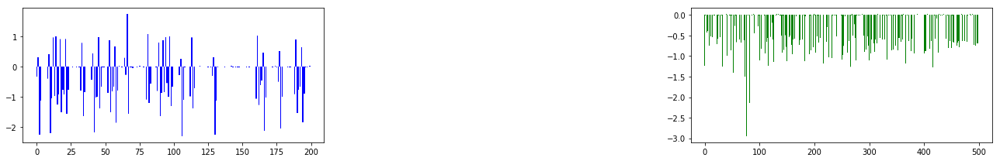


Iteration 48:  TOKYO, 2009 
EPSILON = 9.645e-01
LR = 1.893e-05
Average Terminal Reward  = -0.120
Day Violations           =     54
Battery Limit Violations =    189
Action MEAN              =  3.410
Action STD DEV           =  2.725


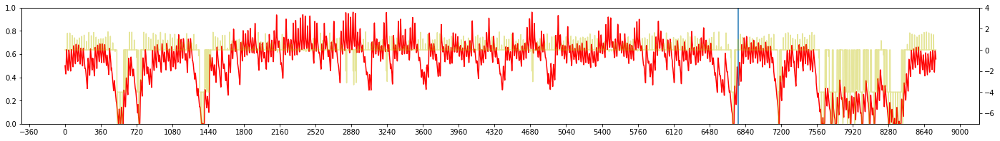

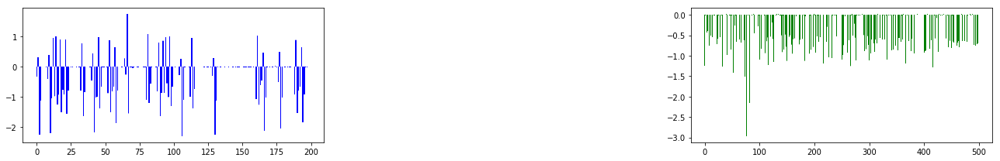


Iteration 49:  TOKYO, 2007 
EPSILON = 9.675e-01
LR = 1.819e-05
Average Terminal Reward  =  0.251
Day Violations           =     34
Battery Limit Violations =     74
Action MEAN              =  3.518
Action STD DEV           =  2.850


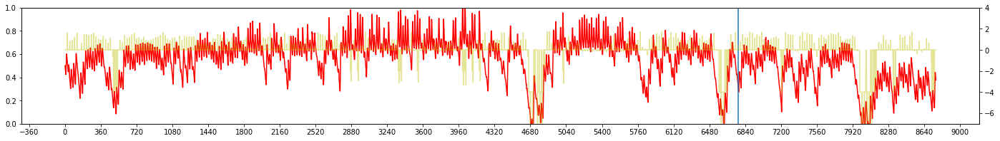

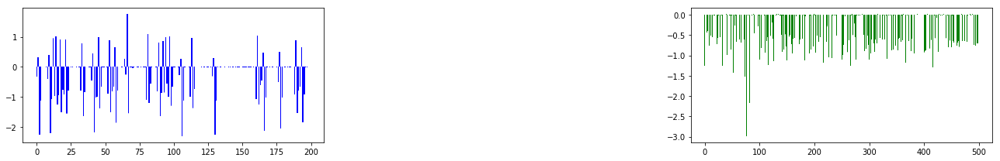


Iteration 50:  TOKYO, 2003 
EPSILON = 9.702e-01
LR = 1.755e-05
Average Terminal Reward  =  0.124
Day Violations           =     36
Battery Limit Violations =    216
Action MEAN              =  3.226
Action STD DEV           =  2.580


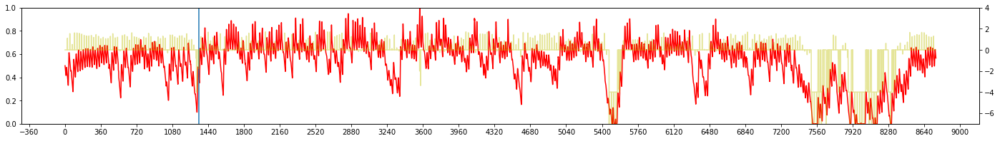

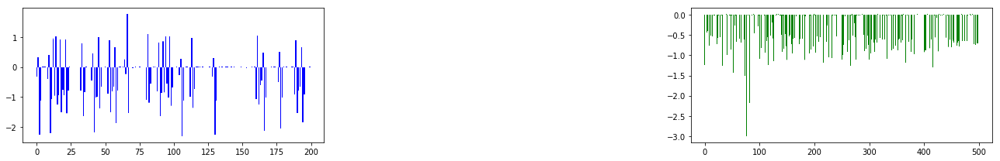


Iteration 51:  TOKYO, 2008 
EPSILON = 9.727e-01
LR = 1.701e-05
Average Terminal Reward  =  0.442
Day Violations           =     21
Battery Limit Violations =     50
Action MEAN              =  3.364
Action STD DEV           =  2.745


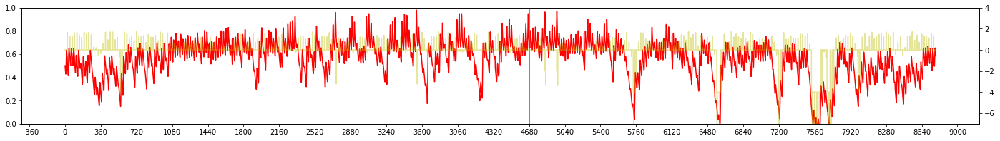

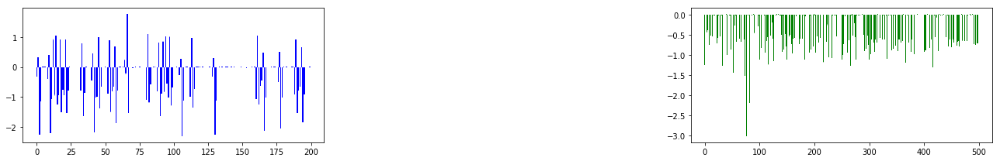


Iteration 52:  TOKYO, 2009 
EPSILON = 9.751e-01
LR = 1.654e-05
Average Terminal Reward  = -0.218
Day Violations           =     57
Battery Limit Violations =     81
Action MEAN              =  3.325
Action STD DEV           =  2.717


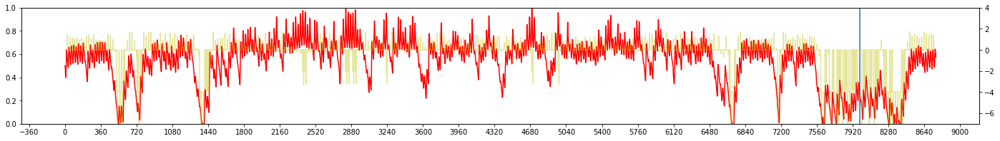

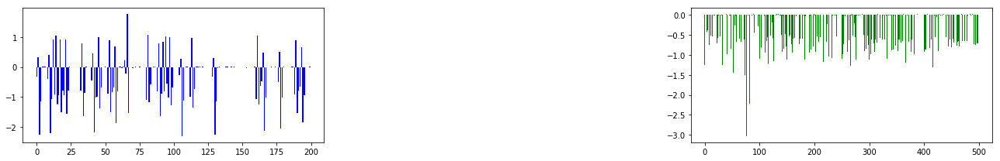


Iteration 53:  TOKYO, 2003 
EPSILON = 9.772e-01
LR = 1.614e-05
Average Terminal Reward  =  0.126
Day Violations           =     38
Battery Limit Violations =    177
Action MEAN              =  3.178
Action STD DEV           =  2.602


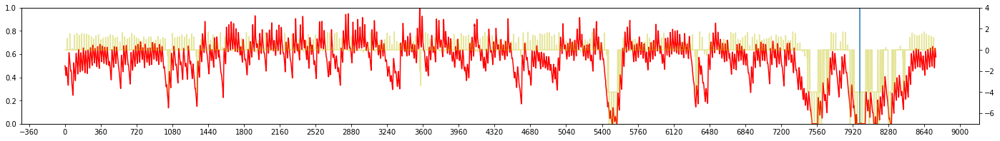

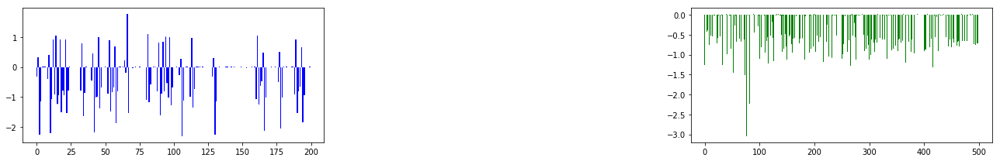


Iteration 54:  TOKYO, 2008 
EPSILON = 9.792e-01
LR = 1.580e-05
Average Terminal Reward  =  0.467
Day Violations           =     21
Battery Limit Violations =     65
Action MEAN              =  3.390
Action STD DEV           =  2.773


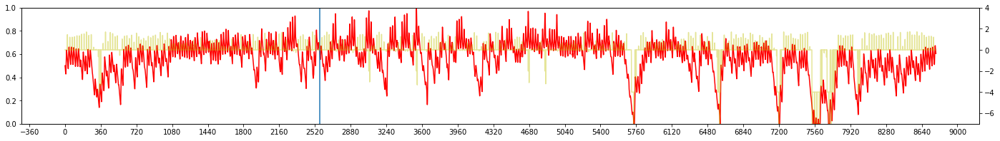

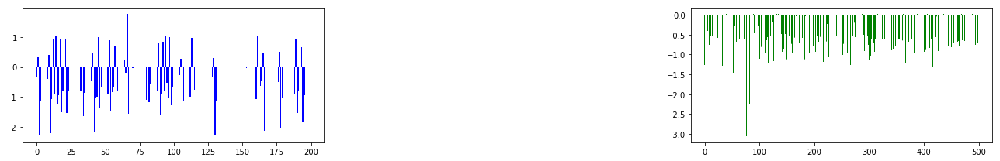


Iteration 55:  TOKYO, 2000 
EPSILON = 9.810e-01
LR = 1.551e-05
Average Terminal Reward  = -0.125
Day Violations           =     51
Battery Limit Violations =    202
Action MEAN              =  3.456
Action STD DEV           =  2.822


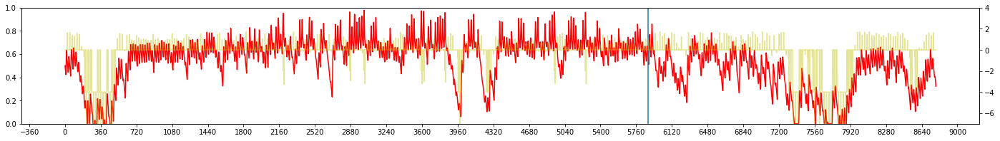

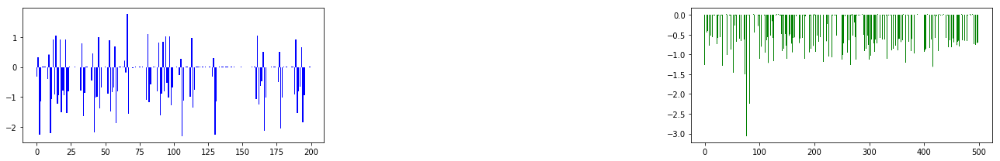


Iteration 56:  TOKYO, 2002 
EPSILON = 9.827e-01
LR = 1.526e-05
Average Terminal Reward  = -0.046
Day Violations           =     46
Battery Limit Violations =    192
Action MEAN              =  3.435
Action STD DEV           =  2.863


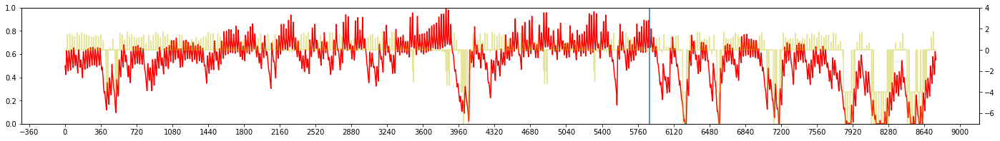

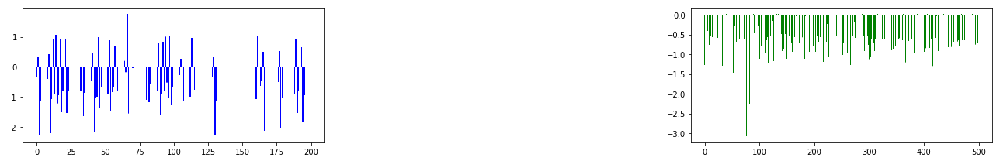


Iteration 57:  TOKYO, 2006 
EPSILON = 9.843e-01
LR = 1.505e-05
Average Terminal Reward  = -0.159
Day Violations           =     54
Battery Limit Violations =    203
Action MEAN              =  3.085
Action STD DEV           =  2.519


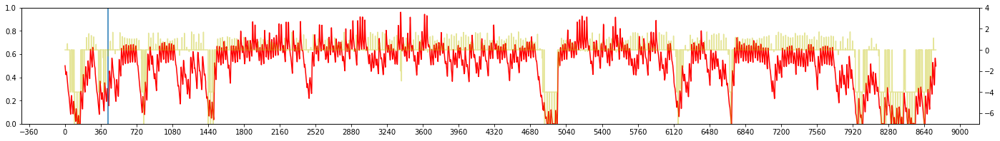

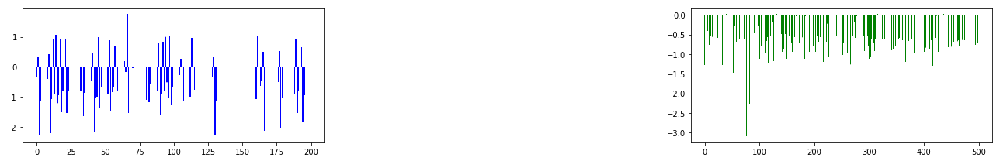


Iteration 58:  TOKYO, 2004 
EPSILON = 9.857e-01
LR = 1.487e-05
Average Terminal Reward  =  0.321
Day Violations           =     31
Battery Limit Violations =    112
Action MEAN              =  3.650
Action STD DEV           =  2.961


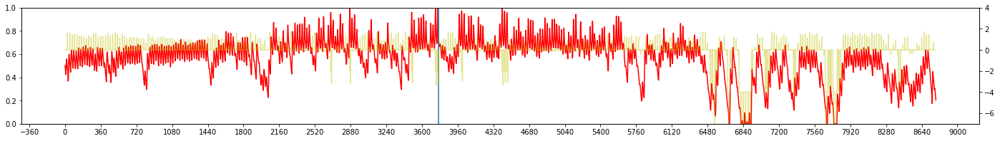

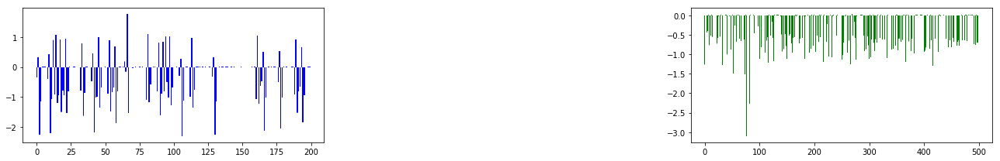


Iteration 59:  TOKYO, 2000 
EPSILON = 9.870e-01
LR = 1.471e-05
Average Terminal Reward  = -0.039
Day Violations           =     45
Battery Limit Violations =    218
Action MEAN              =  3.456
Action STD DEV           =  2.797


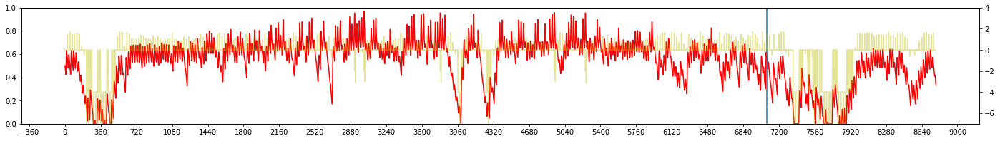

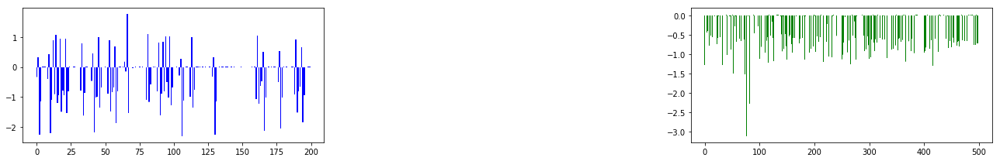


Iteration 60:  TOKYO, 2009 
EPSILON = 9.881e-01
LR = 1.458e-05
Average Terminal Reward  = -0.053
Day Violations           =     52
Battery Limit Violations =    107
Action MEAN              =  3.356
Action STD DEV           =  2.704


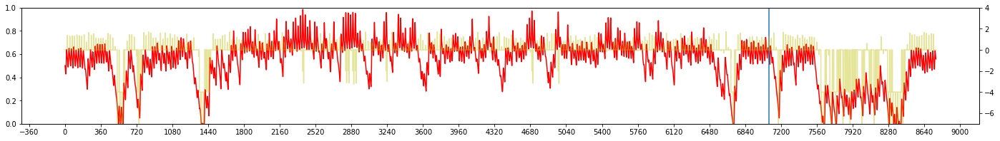

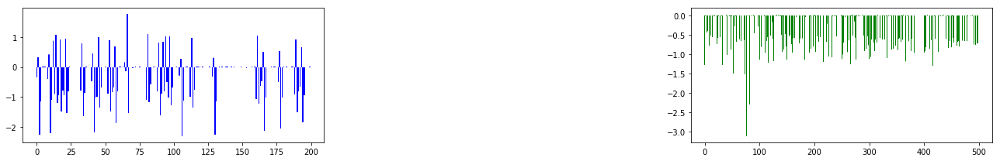


Iteration 61:  TOKYO, 2009 
EPSILON = 9.892e-01
LR = 1.446e-05
Average Terminal Reward  =  0.053
Day Violations           =     45
Battery Limit Violations =    143
Action MEAN              =  3.383
Action STD DEV           =  2.690


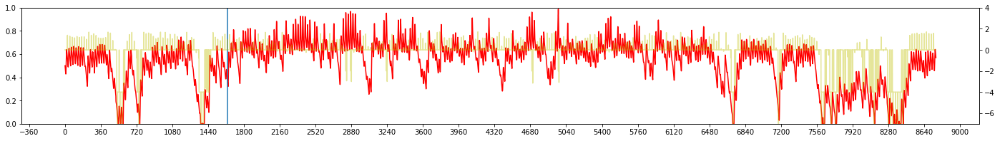

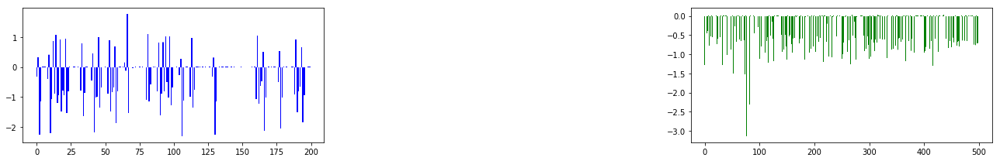


Iteration 62:  TOKYO, 2001 
EPSILON = 9.902e-01
LR = 1.437e-05
Average Terminal Reward  =  0.661
Day Violations           =     19
Battery Limit Violations =      5
Action MEAN              =  3.392
Action STD DEV           =  2.734


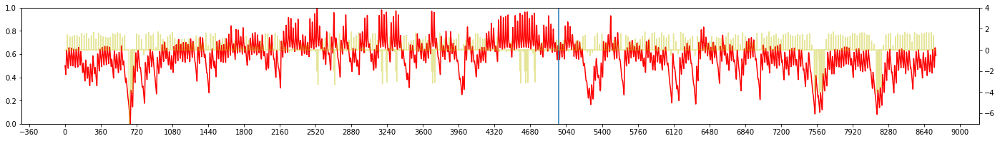

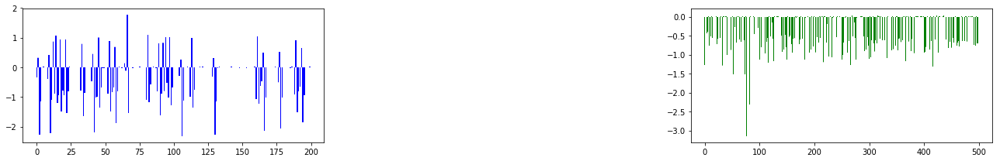


Iteration 63:  TOKYO, 2007 
EPSILON = 9.911e-01
LR = 1.428e-05
Average Terminal Reward  =  0.362
Day Violations           =     29
Battery Limit Violations =     19
Action MEAN              =  3.481
Action STD DEV           =  2.805


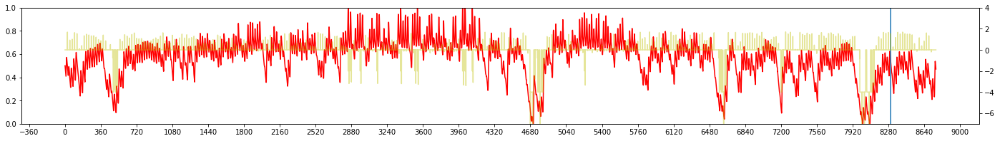

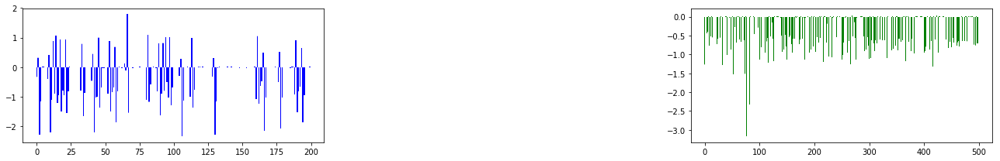


Iteration 64:  TOKYO, 2006 
EPSILON = 9.919e-01
LR = 1.421e-05
Average Terminal Reward  = -0.127
Day Violations           =     53
Battery Limit Violations =    199
Action MEAN              =  3.122
Action STD DEV           =  2.443


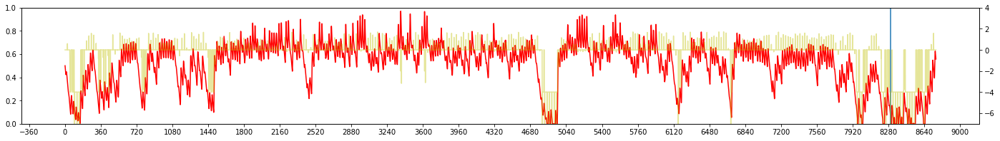

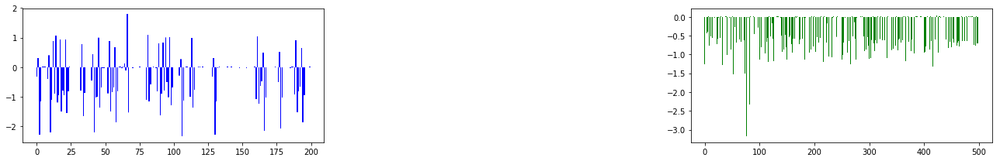


Iteration 65:  TOKYO, 2001 
EPSILON = 9.927e-01
LR = 1.415e-05
Average Terminal Reward  =  0.577
Day Violations           =     22
Battery Limit Violations =      1
Action MEAN              =  3.393
Action STD DEV           =  2.704


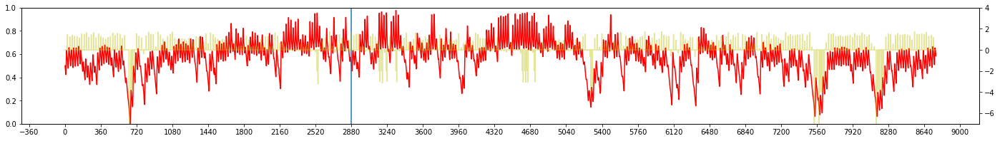

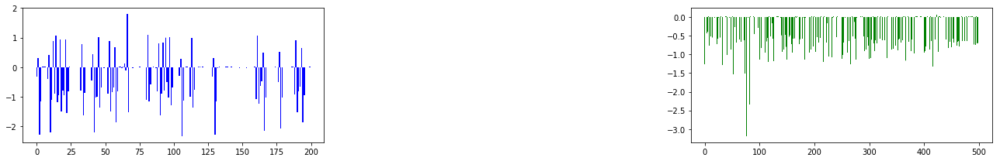


Iteration 66:  TOKYO, 2001 
EPSILON = 9.934e-01
LR = 1.410e-05
Average Terminal Reward  =  0.667
Day Violations           =     15
Battery Limit Violations =      0
Action MEAN              =  3.392
Action STD DEV           =  2.700


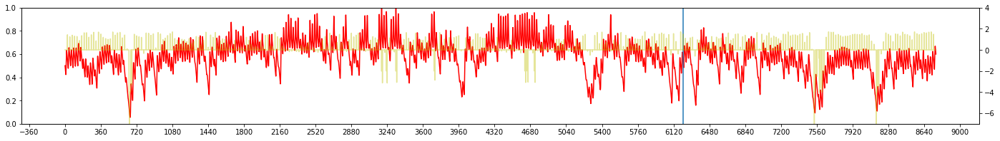

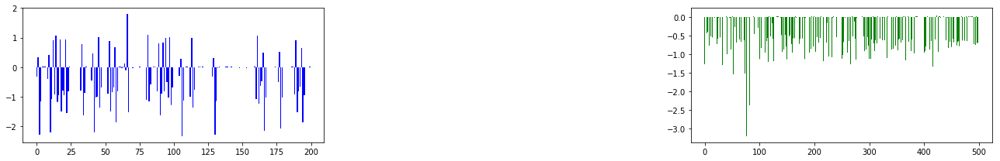


Iteration 67:  TOKYO, 2008 
EPSILON = 9.940e-01
LR = 1.406e-05
Average Terminal Reward  =  0.534
Day Violations           =     19
Battery Limit Violations =     47
Action MEAN              =  3.372
Action STD DEV           =  2.708


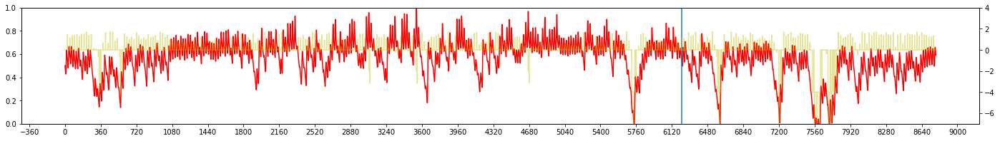

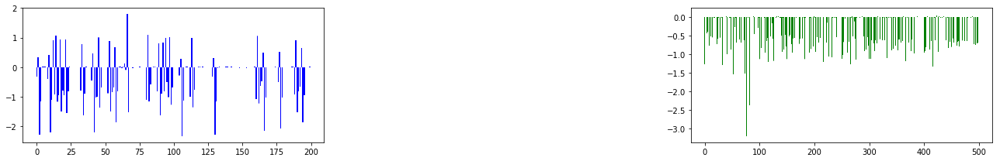


Iteration 68:  TOKYO, 2003 
EPSILON = 9.945e-01
LR = 1.402e-05
Average Terminal Reward  =  0.297
Day Violations           =     31
Battery Limit Violations =    136
Action MEAN              =  3.174
Action STD DEV           =  2.594


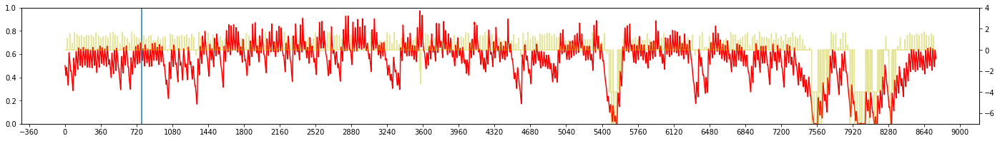

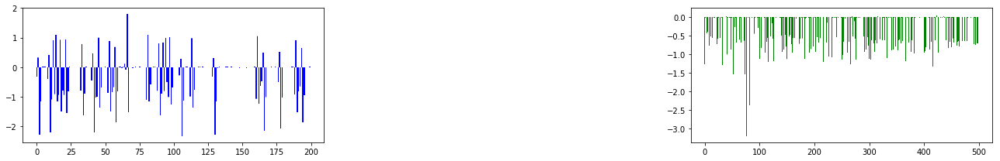


Iteration 69:  TOKYO, 2003 
EPSILON = 9.950e-01
LR = 1.398e-05
Average Terminal Reward  =  0.240
Day Violations           =     33
Battery Limit Violations =    214
Action MEAN              =  3.226
Action STD DEV           =  2.591


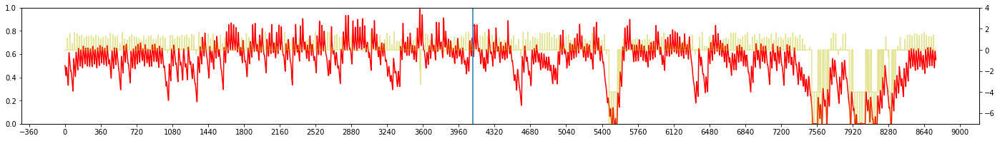

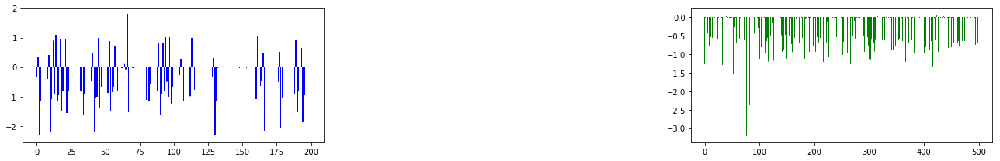


Iteration 70:  TOKYO, 2004 
EPSILON = 9.955e-01
LR = 1.396e-05
Average Terminal Reward  =  0.376
Day Violations           =     26
Battery Limit Violations =     96
Action MEAN              =  3.628
Action STD DEV           =  2.943


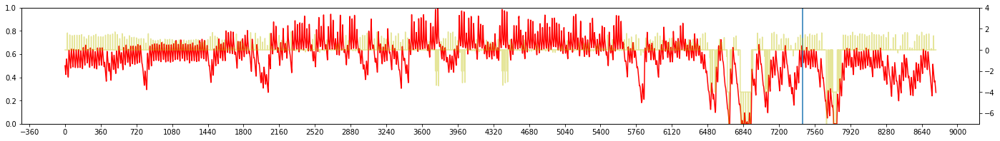

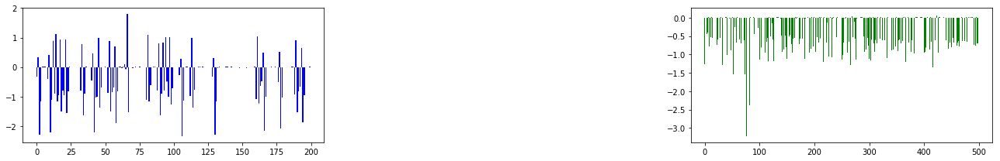


Iteration 71:  TOKYO, 2008 
EPSILON = 9.959e-01
LR = 1.393e-05
Average Terminal Reward  =  0.570
Day Violations           =     17
Battery Limit Violations =     24
Action MEAN              =  3.362
Action STD DEV           =  2.747


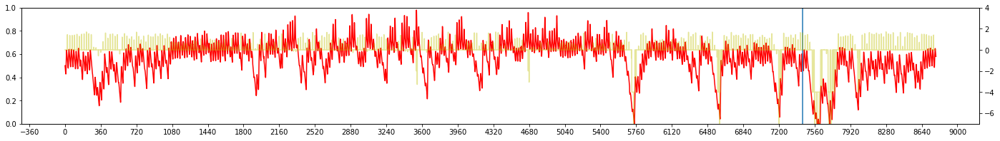

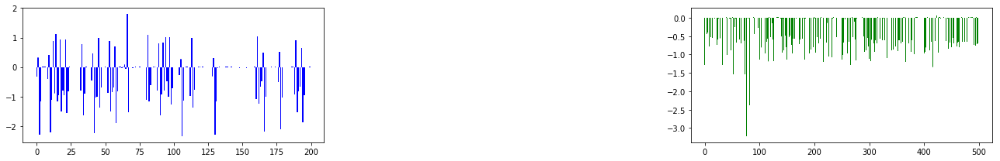


Iteration 72:  TOKYO, 2003 
EPSILON = 9.963e-01
LR = 1.391e-05
Average Terminal Reward  =  0.275
Day Violations           =     31
Battery Limit Violations =    172
Action MEAN              =  3.189
Action STD DEV           =  2.580


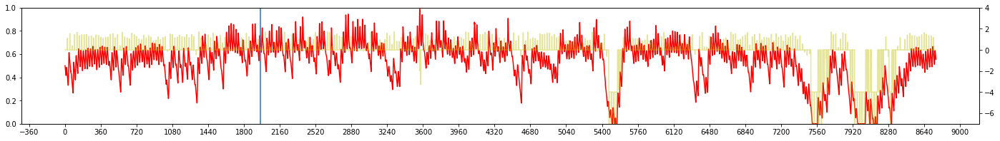

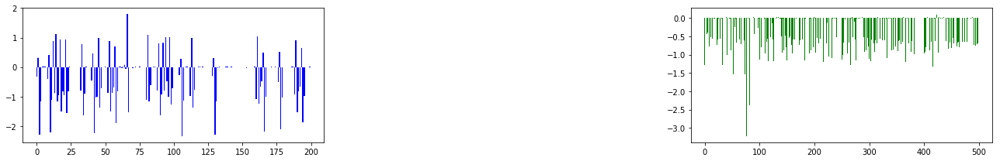


Iteration 73:  TOKYO, 2000 
EPSILON = 9.967e-01
LR = 1.390e-05
Average Terminal Reward  =  0.059
Day Violations           =     43
Battery Limit Violations =    158
Action MEAN              =  3.408
Action STD DEV           =  2.761


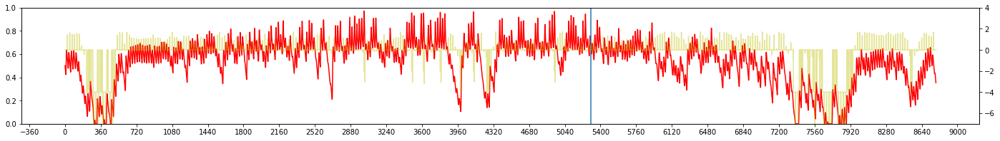

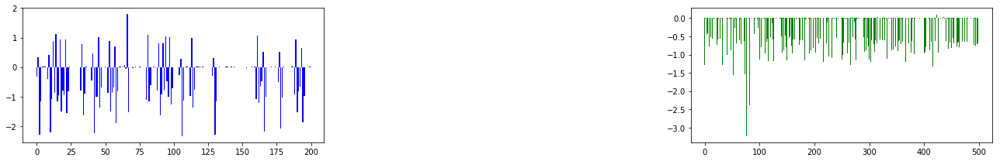


Iteration 74:  TOKYO, 2002 
EPSILON = 9.970e-01
LR = 1.388e-05
Average Terminal Reward  =  0.078
Day Violations           =     43
Battery Limit Violations =    163
Action MEAN              =  3.468
Action STD DEV           =  2.771


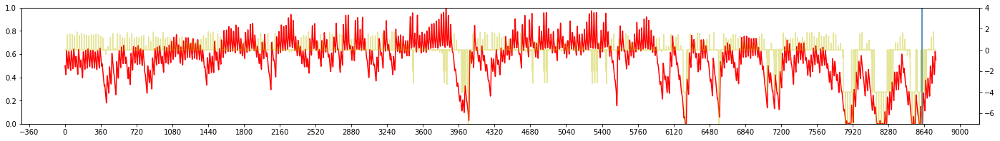

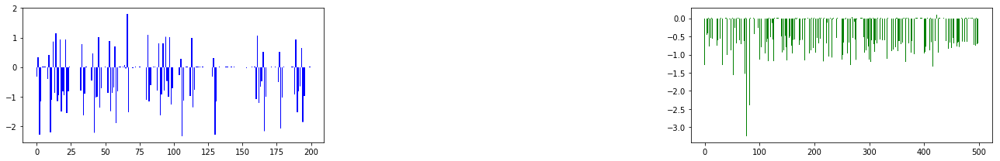


Iteration 75:  TOKYO, 2000 
EPSILON = 9.973e-01
LR = 1.387e-05
Average Terminal Reward  =  0.008
Day Violations           =     47
Battery Limit Violations =    154
Action MEAN              =  3.416
Action STD DEV           =  2.727


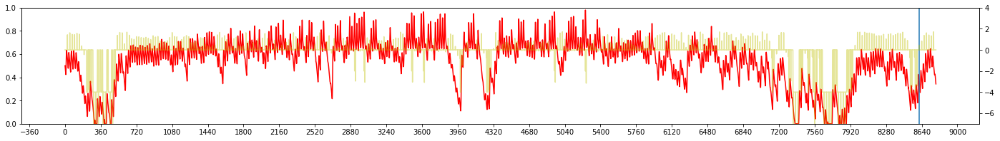

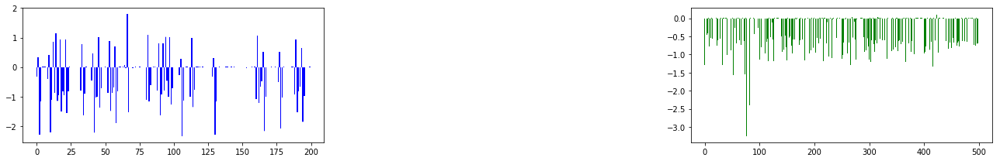


Iteration 76:  TOKYO, 2000 
EPSILON = 9.975e-01
LR = 1.386e-05
Average Terminal Reward  =  0.082
Day Violations           =     42
Battery Limit Violations =    158
Action MEAN              =  3.420
Action STD DEV           =  2.727


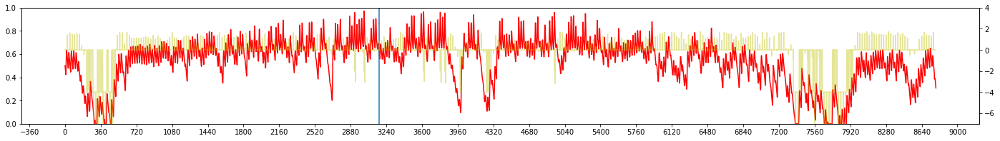

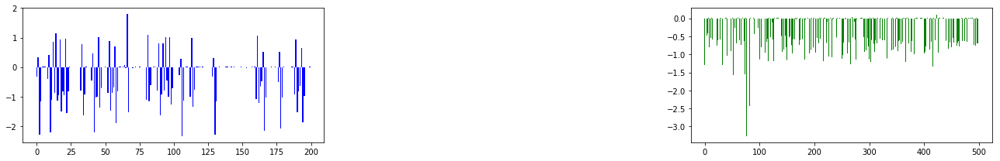


Iteration 77:  TOKYO, 2004 
EPSILON = 9.977e-01
LR = 1.385e-05
Average Terminal Reward  =  0.350
Day Violations           =     29
Battery Limit Violations =     74
Action MEAN              =  3.628
Action STD DEV           =  2.890


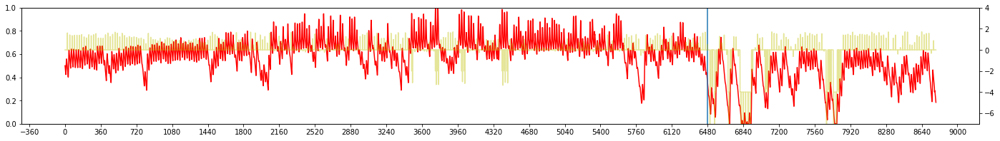

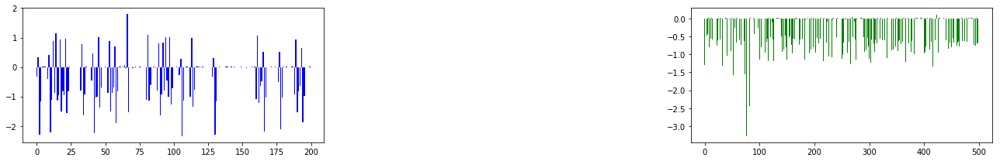


Iteration 78:  TOKYO, 2001 
EPSILON = 9.980e-01
LR = 1.384e-05
Average Terminal Reward  =  0.731
Day Violations           =     14
Battery Limit Violations =      0
Action MEAN              =  3.393
Action STD DEV           =  2.729


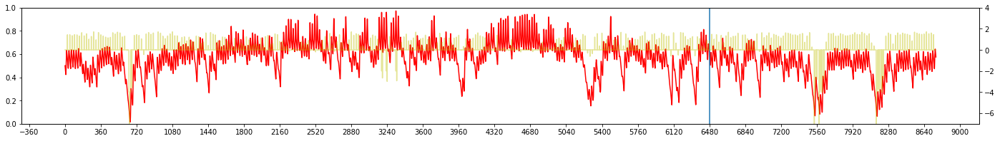

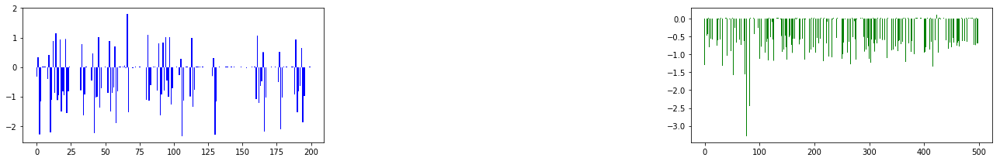


Iteration 79:  TOKYO, 2009 
EPSILON = 9.982e-01
LR = 1.383e-05
Average Terminal Reward  =  0.285
Day Violations           =     35
Battery Limit Violations =     69
Action MEAN              =  3.331
Action STD DEV           =  2.683


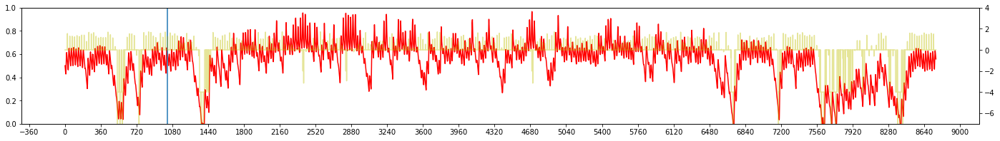

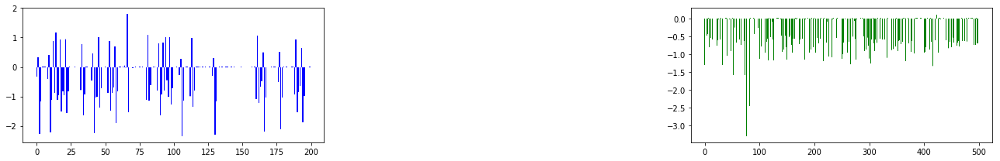


Iteration 80:  TOKYO, 2004 
EPSILON = 9.983e-01
LR = 1.383e-05
Average Terminal Reward  =  0.434
Day Violations           =     26
Battery Limit Violations =     72
Action MEAN              =  3.611
Action STD DEV           =  2.910


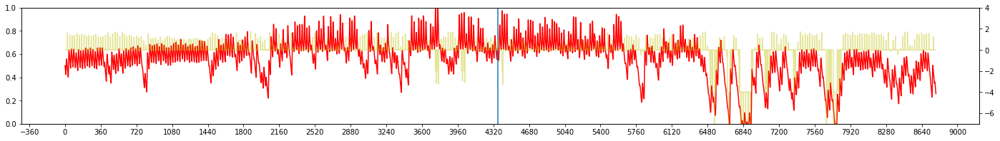

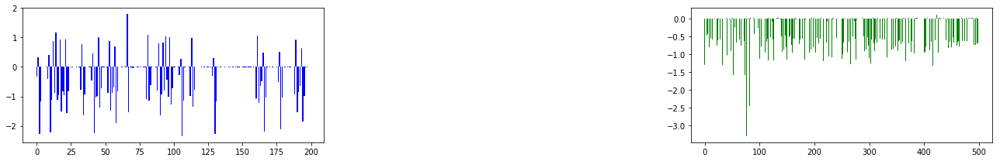


Iteration 81:  TOKYO, 2009 
EPSILON = 9.985e-01
LR = 1.382e-05
Average Terminal Reward  =  0.294
Day Violations           =     33
Battery Limit Violations =     66
Action MEAN              =  3.338
Action STD DEV           =  2.677


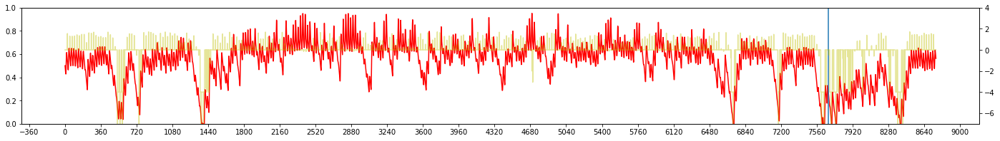

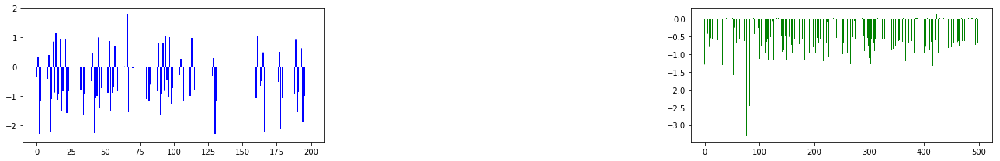


Iteration 82:  TOKYO, 2007 
EPSILON = 9.986e-01
LR = 1.382e-05
Average Terminal Reward  =  0.427
Day Violations           =     25
Battery Limit Violations =     45
Action MEAN              =  3.497
Action STD DEV           =  2.795


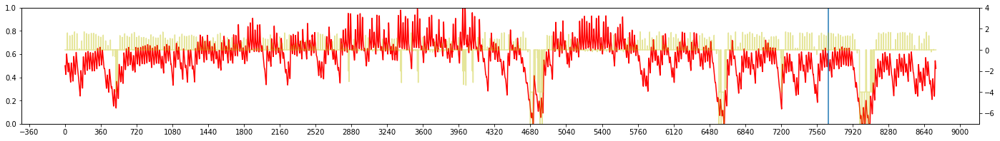

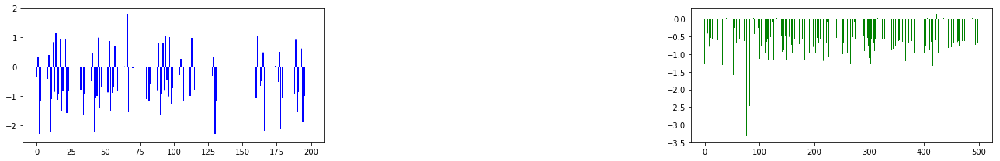


Iteration 83:  TOKYO, 2002 
EPSILON = 9.988e-01
LR = 1.381e-05
Average Terminal Reward  =  0.085
Day Violations           =     43
Battery Limit Violations =    173
Action MEAN              =  3.460
Action STD DEV           =  2.747


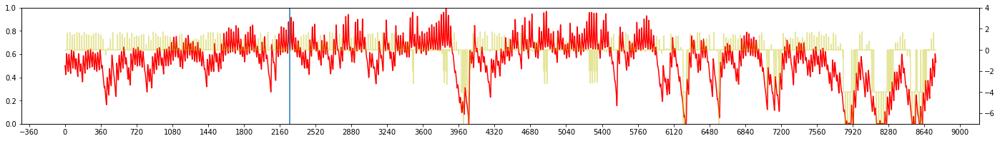

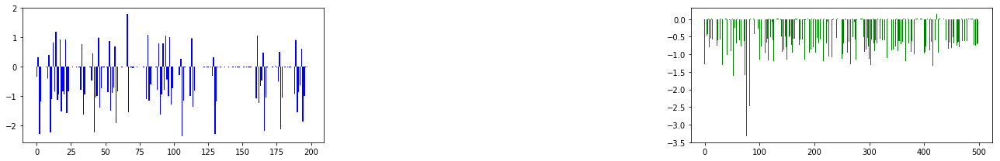


Iteration 84:  TOKYO, 2003 
EPSILON = 9.989e-01
LR = 1.381e-05
Average Terminal Reward  =  0.297
Day Violations           =     32
Battery Limit Violations =    155
Action MEAN              =  3.214
Action STD DEV           =  2.525


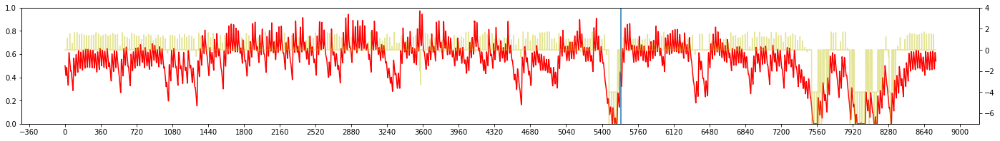

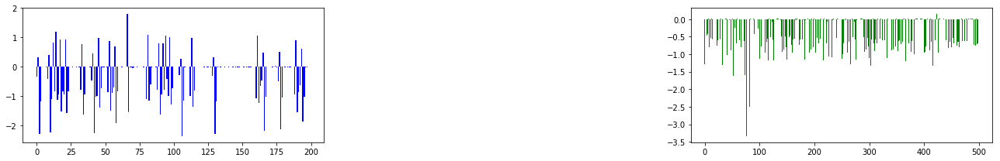


Iteration 85:  TOKYO, 2000 
EPSILON = 9.990e-01
LR = 1.381e-05
Average Terminal Reward  =  0.076
Day Violations           =     45
Battery Limit Violations =    155
Action MEAN              =  3.412
Action STD DEV           =  2.686


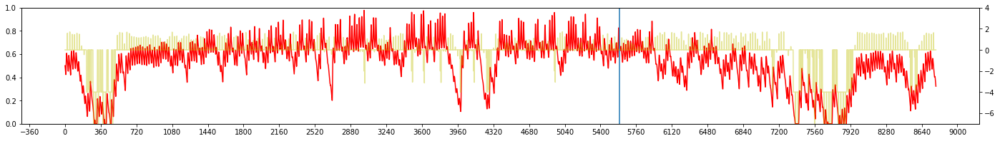

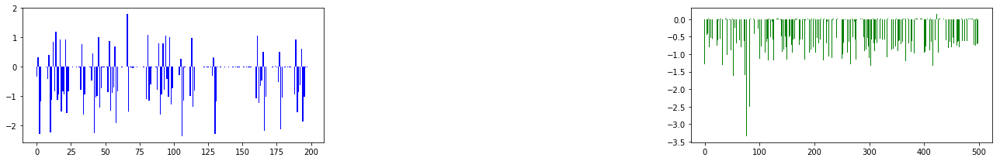


Iteration 86:  TOKYO, 2003 
EPSILON = 9.991e-01
LR = 1.381e-05
Average Terminal Reward  =  0.287
Day Violations           =     33
Battery Limit Violations =    153
Action MEAN              =  3.193
Action STD DEV           =  2.515


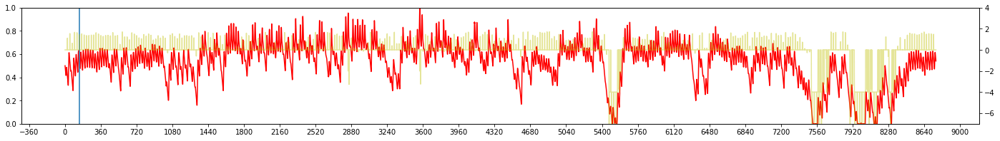

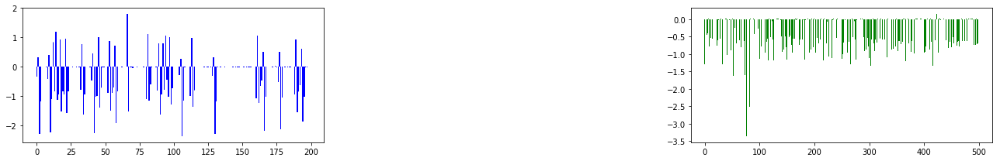


Iteration 87:  TOKYO, 2000 
EPSILON = 9.992e-01
LR = 1.380e-05
Average Terminal Reward  =  0.086
Day Violations           =     42
Battery Limit Violations =    177
Action MEAN              =  3.480
Action STD DEV           =  2.732


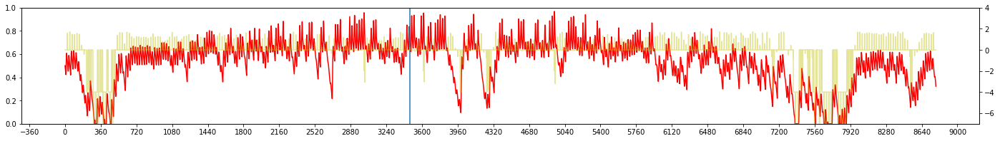

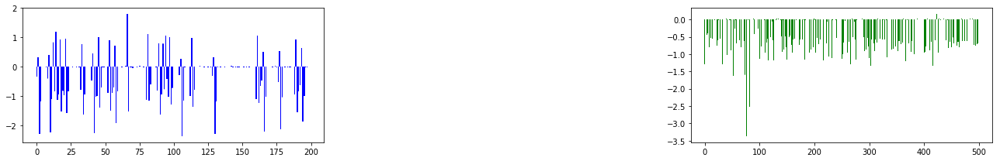


Iteration 88:  TOKYO, 2008 
EPSILON = 9.992e-01
LR = 1.380e-05
Average Terminal Reward  =  0.524
Day Violations           =     20
Battery Limit Violations =     16
Action MEAN              =  3.360
Action STD DEV           =  2.666


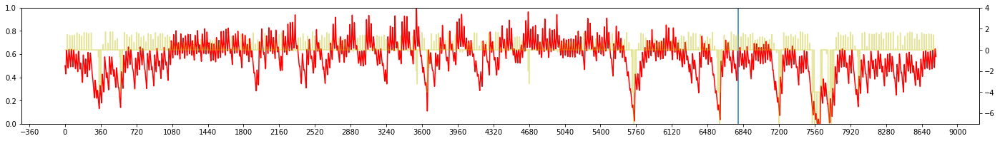

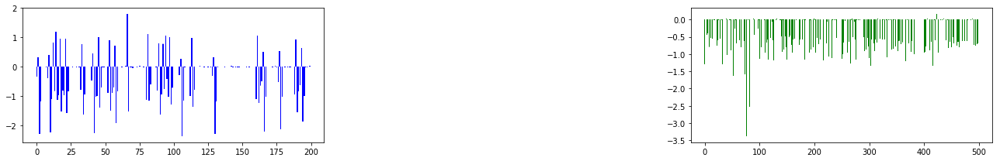


Iteration 89:  TOKYO, 2001 
EPSILON = 9.993e-01
LR = 1.380e-05
Average Terminal Reward  =  0.640
Day Violations           =     21
Battery Limit Violations =      1
Action MEAN              =  3.393
Action STD DEV           =  2.698


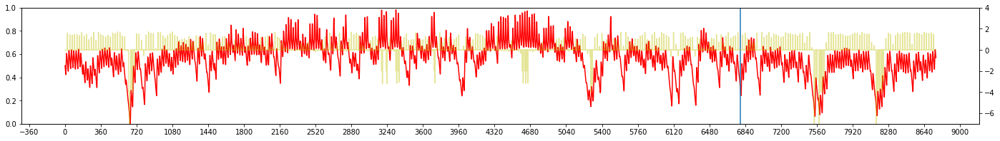

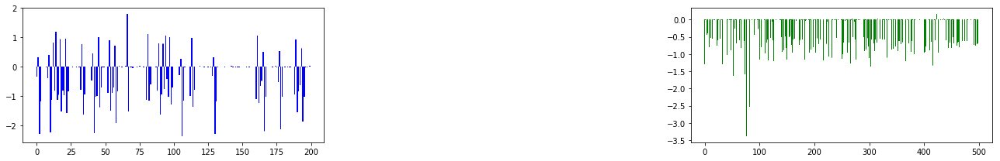


Iteration 90:  TOKYO, 2003 
EPSILON = 9.994e-01
LR = 1.380e-05
Average Terminal Reward  =  0.276
Day Violations           =     33
Battery Limit Violations =    189
Action MEAN              =  3.224
Action STD DEV           =  2.527


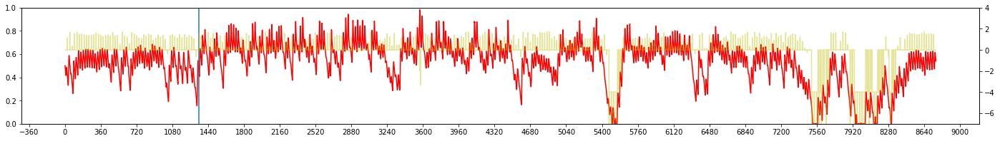

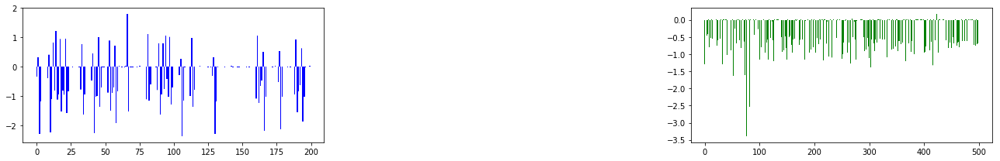


Iteration 91:  TOKYO, 2006 
EPSILON = 9.994e-01
LR = 1.380e-05
Average Terminal Reward  = -0.091
Day Violations           =     54
Battery Limit Violations =    211
Action MEAN              =  3.161
Action STD DEV           =  2.467


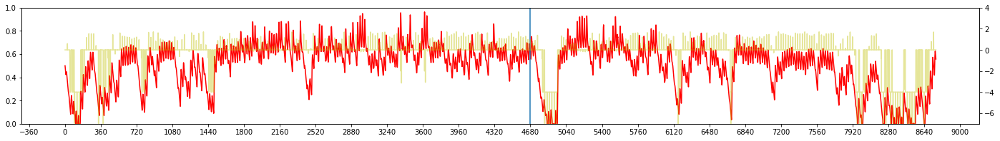

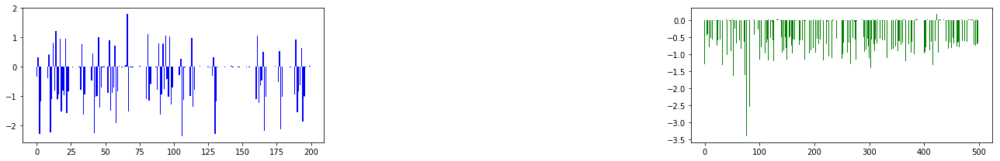


Iteration 92:  TOKYO, 2005 
EPSILON = 9.995e-01
LR = 1.380e-05
Average Terminal Reward  =  0.740
Day Violations           =     11
Battery Limit Violations =     26
Action MEAN              =  3.419
Action STD DEV           =  2.694


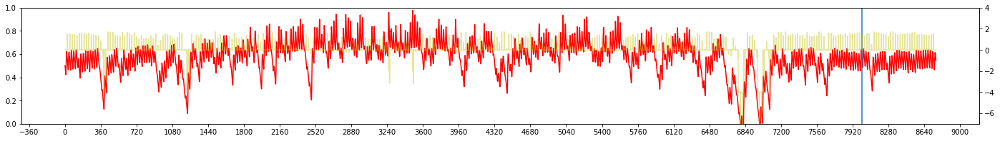

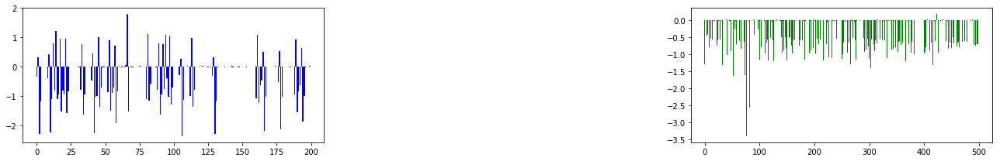


Iteration 93:  TOKYO, 2000 
EPSILON = 9.995e-01
LR = 1.380e-05
Average Terminal Reward  =  0.118
Day Violations           =     41
Battery Limit Violations =    152
Action MEAN              =  3.427
Action STD DEV           =  2.723


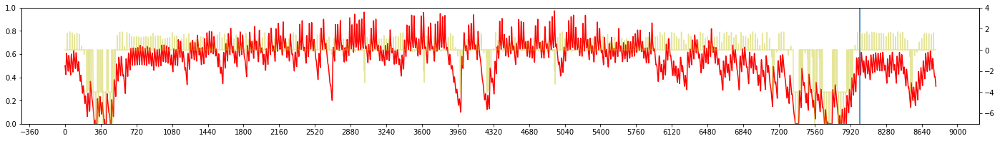

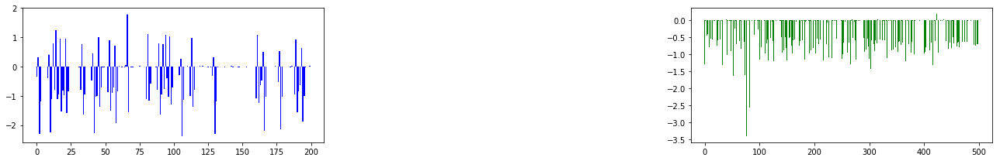


Iteration 94:  TOKYO, 2004 
EPSILON = 9.996e-01
LR = 1.380e-05
Average Terminal Reward  =  0.359
Day Violations           =     29
Battery Limit Violations =     71
Action MEAN              =  3.609
Action STD DEV           =  2.858


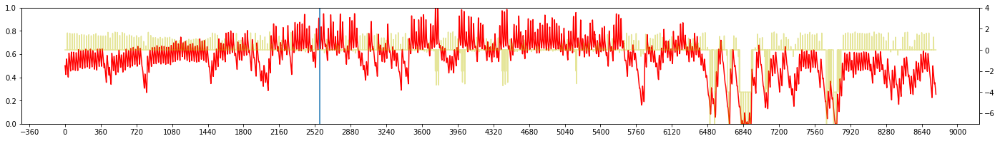

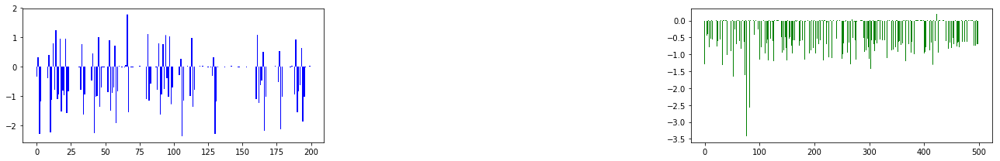


Iteration 95:  TOKYO, 2009 
EPSILON = 9.996e-01
LR = 1.380e-05
Average Terminal Reward  =  0.265
Day Violations           =     37
Battery Limit Violations =     82
Action MEAN              =  3.354
Action STD DEV           =  2.630


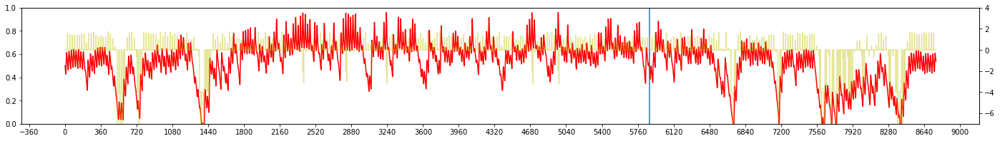

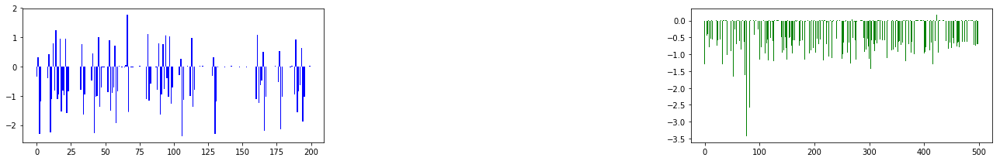


Iteration 96:  TOKYO, 2000 
EPSILON = 9.997e-01
LR = 1.380e-05
Average Terminal Reward  =  0.096
Day Violations           =     43
Battery Limit Violations =    157
Action MEAN              =  3.425
Action STD DEV           =  2.700


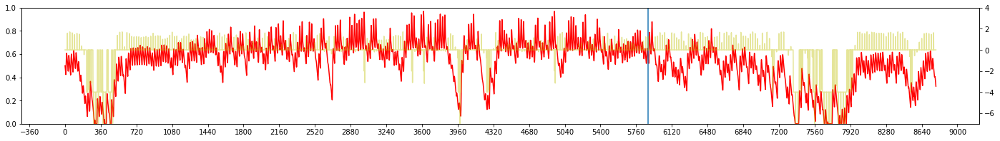

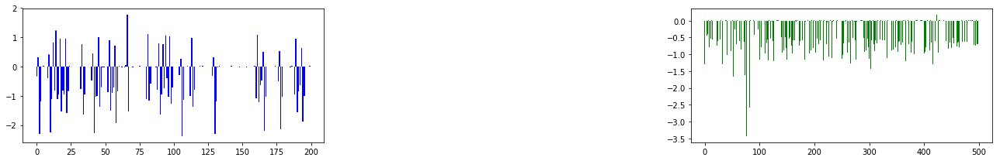


Iteration 97:  TOKYO, 2007 
EPSILON = 9.997e-01
LR = 1.380e-05
Average Terminal Reward  =  0.412
Day Violations           =     29
Battery Limit Violations =     42
Action MEAN              =  3.490
Action STD DEV           =  2.745


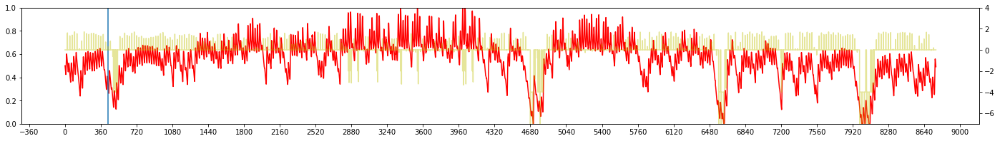

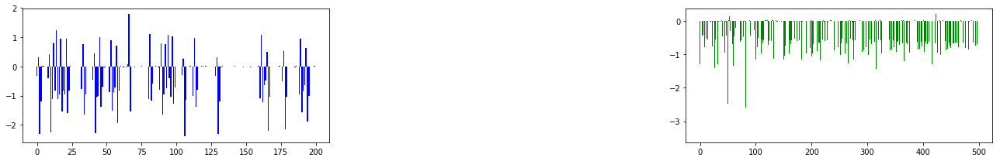


Iteration 98:  TOKYO, 2001 
EPSILON = 9.997e-01
LR = 1.380e-05
Average Terminal Reward  =  0.652
Day Violations           =     21
Battery Limit Violations =      3
Action MEAN              =  3.394
Action STD DEV           =  2.675


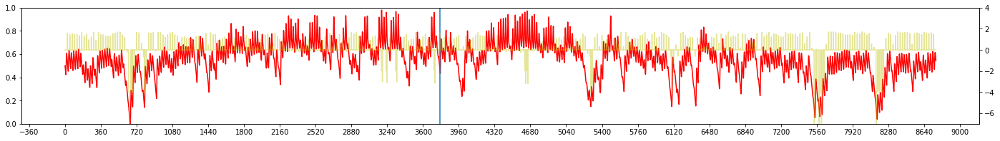

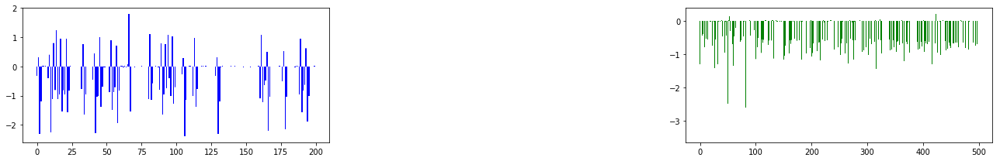


Iteration 99:  TOKYO, 2001 
EPSILON = 9.997e-01
LR = 1.379e-05
Average Terminal Reward  =  0.613
Day Violations           =     24
Battery Limit Violations =      2
Action MEAN              =  3.394
Action STD DEV           =  2.657


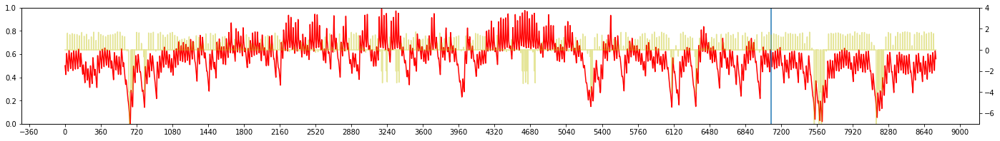

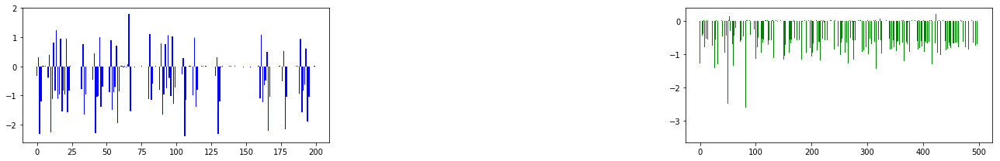

In [15]:
#TRAIN 
dqn = DQN()
# for recording weights
oldfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
old2fc1 = oldfc1

# oldfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
# old2fc2 = oldfc2

# oldfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
# old2fc3 = oldfc3

oldout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
old2out = oldout
########################################

change_hr = 0 #when dqn target_net is updated by eval_net
avg_reward_rec = [] #record the yearly average rewards over the entire duration of training
batt_violation_rec = []
day_violation_rec = []

print('Device: ', dqn.device)
#TRAINING STARTS
tic = datetime.now()

for iteration in range(NO_OF_ITERATIONS):
    # EPSILON SCHEDULING
    e_slope = 10
    e_start = 0.75
    e_inflection_point = 30
    EPSILON = e_start + (1-e_start)/(1 + np.exp(-(iteration-e_inflection_point)/e_slope))

    # LR SCEHDULING
    lr_slope = 3
    lr_start = 0
    lr_inflection_point = 2
    if iteration <=30:
        lrate =  (lr_start + (1-lr_start)/(1 + np.exp(-(iteration-lr_inflection_point)/lr_slope)))*1e-4
    else:
        lrate = 0.95*(lrate-lrate*0.1)+0.2*1e-5
    dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate)
#     dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate, weight_decay=WT_DECAY)

    LOCATION    = 'tokyo'#random.choice(['tokyo','wakkanai','minamidaito'])
    YEAR        = random.choice(np.arange(2000,2010))
    
    capm        = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno    = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX   = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object


    s, r, day_end, year_end = capm.reset()
    yr_record      = np.empty(4)
    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        a = dqn.choose_action(stdize(s))
        yr_record = np.vstack((yr_record, [s[0],s[2],r, a]))

        # take action
        s_, r, day_end, year_end = capm.step(a)
        
        temp_transitions                = np.hstack((stdize(s), [a, r], stdize(s_)))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5] += r #broadcast reward to all states
            decay_factor         = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
            transition_rec[:,5]  = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if dqn.nettoggle:
            change_hr = capm.eno.day*24+capm.eno.hr #to mark when the DQN is updated.
            dqn.nettoggle = not dqn.nettoggle

        if (year_end):
            break

        # transition to new state
        s = s_

    yr_record = np.delete(yr_record, 0, 0)     #remove the first row which is garbage
    hourly_yr_reward_rec = yr_record[:,2]      #extract reward information from the record array
    yr_reward_rec = hourly_yr_reward_rec[::24] #only consider terminal rewards

    print('\nIteration {}:  {}, {} '.format(iteration, LOCATION.upper(), YEAR))
    print('EPSILON = {:6.3e}'.format(EPSILON))
    for param_group in dqn.optimizer.param_groups:
        print('LR = {:6.3e}'.format(param_group['lr']))
    print("Average Terminal Reward  = {:6.3f}".format(np.mean(yr_reward_rec)))
    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Action MEAN              = {:6.3f}".format(np.mean(yr_record[:,-1] + 1)))
    print("Action STD DEV           = {:6.3f}".format(np.std(yr_record[:,-1] + 1)))
   
    # Log the average reward in avg_reward_rec to plot later in the learning curve graph figure
    avg_reward_rec      = np.append(avg_reward_rec, np.mean(yr_reward_rec))
    day_violation_rec   = np.append(day_violation_rec, capm.violation_counter)
    batt_violation_rec  = np.append(batt_violation_rec, capm.batt_violations)

###########################################################################################
###########################################################################################
#   PLOT battery levels, hourly rewards and the weights

    fig = plt.figure(figsize=(24,3))
    TIME_STEPS = capm.eno.TIME_STEPS
    NO_OF_DAYS = capm.eno.NO_OF_DAYS
    DAY_SPACING = 15
    TICK_SPACING = TIME_STEPS*DAY_SPACING
    #plot battery
    
    ax = fig.add_subplot(111)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS),yr_record[:,0],'r')
    ax.set_ylim([0,1])
    ax.axvline(x=change_hr)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING))

    #plot hourly reward
    ax0 = ax.twinx()
    ax0.plot(hourly_yr_reward_rec, color='y',alpha=0.4)
    ax0.set_ylim(-7,4)
    plt.show()

    fig = plt.figure(figsize=(18,3))
    
    ax1 = fig.add_subplot(131)
    newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
    xaxis = np.arange(0,newfc1.shape[0])
    ax1.bar(xaxis, old2fc1, color='b', alpha = 0.3)
    ax1.bar(xaxis, oldfc1,  color='b', alpha = 0.5)
    ax1.bar(xaxis, newfc1,  color='b', alpha = 1.0)
#     ax1.plot(xaxis, old2fc1, color='b', alpha = 0.2)
#     ax1.plot(xaxis, oldfc1,  color='b', alpha = 0.3)
#     ax1.plot(xaxis, newfc1,  color='b', alpha = 0.4)
#     ax1.hist(old2fc1, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.1 )
#     ax1.hist(oldfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.3 )
#     ax1.hist(newfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.6 )
    old2fc1 = oldfc1
    oldfc1 = newfc1
    
#     ax2 = fig.add_subplot(132)
#     newfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newfc2.shape[0])
#     ax2.bar(xaxis, old2fc2, color='y', alpha = 0.3)
#     ax2.bar(xaxis, oldfc2,  color='y', alpha = 0.5)
#     ax2.bar(xaxis, newfc2,  color='y', alpha = 1.0)
# #     ax2.plot(old2fc2,color='y', alpha=0.4)
# #     ax2.plot(oldfc2,color='y',alpha = 0.7)
# #     ax2.plot(newfc2,color='y')
#     old2fc2 = oldfc2
#     oldfc2 = newfc2
    
#     ax3 = fig.add_subplot(143)
#     newfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
#     ax3.plot(old2fc3,color='y', alpha=0.4)
#     ax3.plot(oldfc3,color='y',alpha = 0.7)
#     ax3.plot(newfc3,color='y')
#     old2fc3 = oldfc3
#     oldfc3 = newfc3
    
    axO = fig.add_subplot(133)
    newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
    xaxis = np.arange(0,newout.shape[0])
    axO.bar(xaxis, old2out, color='g', alpha = 0.3)
    axO.bar(xaxis, oldout,  color='g', alpha = 0.5)
    axO.bar(xaxis, newout,  color='g', alpha = 1.0)
#     axO.plot(old2out, color='g', alpha = 0.2)
#     axO.plot(oldout,  color='g', alpha = 0.3)
#     axO.plot(newout,  color='g', alpha = 0.4)
#     axO.hist(old2out, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.1)
#     axO.hist(oldout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.3)
#     axO.hist(newout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.6)
    old2out = oldout
    oldout = newout
    
    fig.tight_layout()
    plt.show()
###########################################################################################
# ###########################################################################################

    # End of training

In [16]:
print('Train time: {}'.format(datetime.now() - tic))
# torch.save(dqn.eval_net.state_dict(), './models/'+MODELNAME)

Train time: 0:34:17.645470


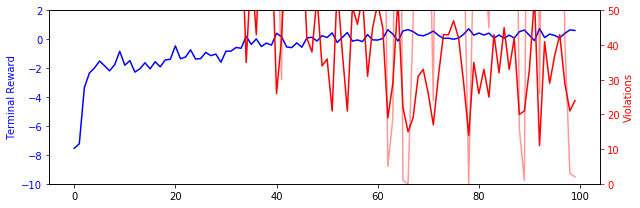

In [17]:
###########################################################################################
###########################################################################################
# Plot the average reward log and the violation record log

fig = plt.figure(figsize=(9,3))

ax1 = fig.add_subplot(111)
ax1.set_ylabel("Terminal Reward", color = 'b')
ax1.set_ylim([-10,2]);
ax1.plot(avg_reward_rec,'b')
ax1.tick_params(axis='y', colors='b')

ax2 = ax1.twinx()
ax2.set_ylabel("Violations",color = 'r')
ax2.plot(day_violation_rec,'r')
ax2.plot(batt_violation_rec,'r',alpha=0.4)
for xpt in np.argwhere(day_violation_rec<1):
    ax2.axvline(x=xpt,color='g')
ax2.set_ylim([0,50]);
ax2.tick_params(axis='y', colors='r')
fig.tight_layout()

###########################################################################################
###########################################################################################

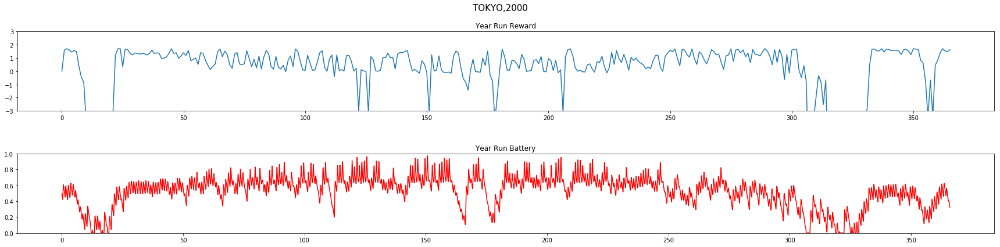

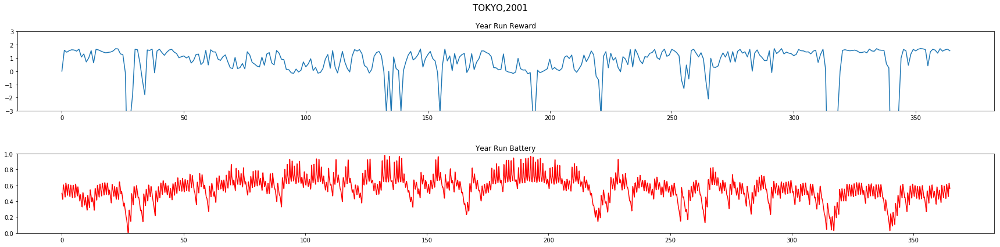

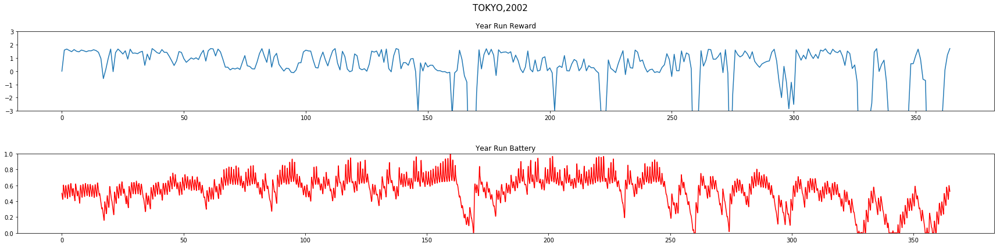

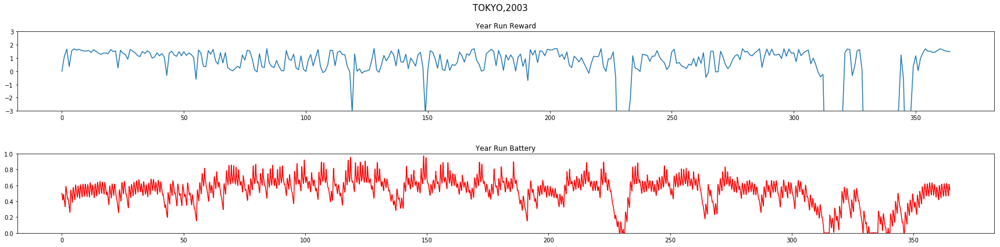

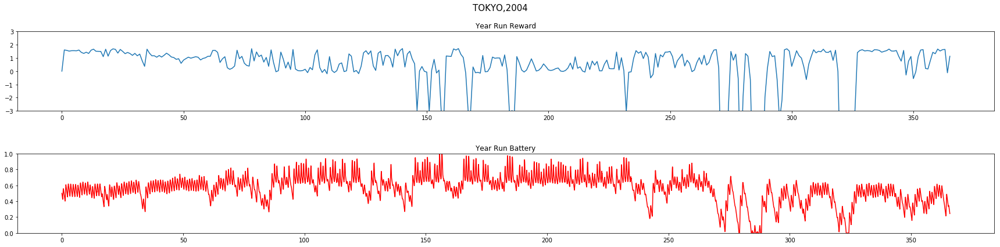

...

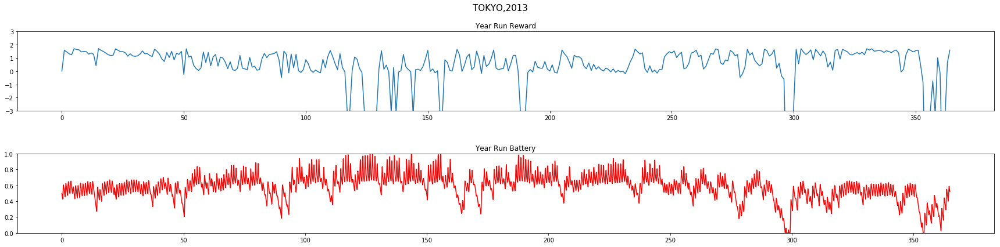

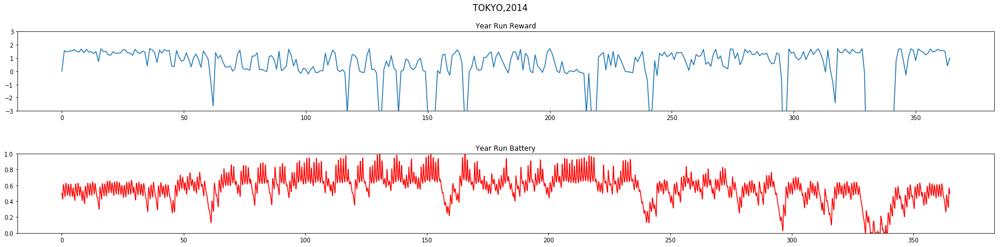

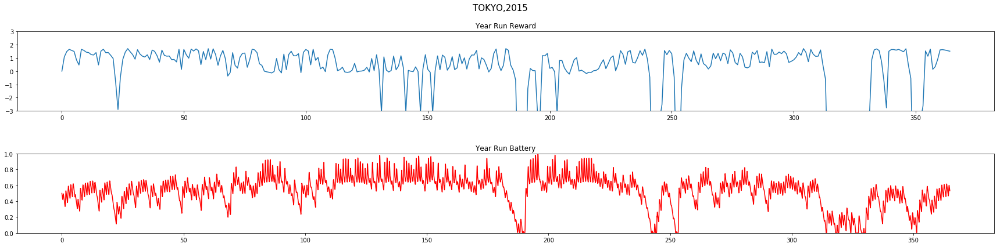

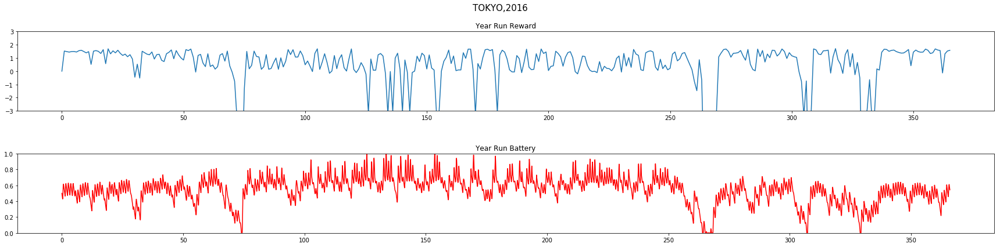

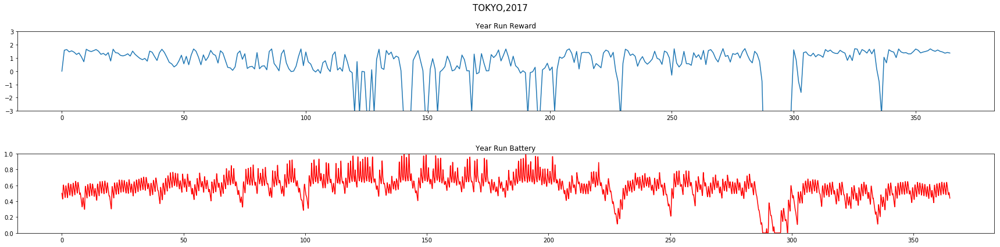

In [18]:
#VALIDATION PHASE
# print("***MEASURING PERFORMANCE OF THE MODEL***")
results = np.empty(4)
LOCATION = 'tokyo'
for YEAR in np.arange(2000,2018):
    capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

    s, r, day_end, year_end = capm.reset()
    yr_test_record = np.empty(4)

    while True:
        a = dqn.choose_greedy_action(stdize(s))
        yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
        s_, r, day_end, year_end = capm.step(a)
        if year_end:
            break
        s = s_

    yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
    yr_test_reward_rec = yr_test_record[:,2]
    yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
    results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations)]))
    
###########################################################################################
###########################################################################################
    #     Plot the reward and battery for the entire year run
    title = LOCATION.upper() + ',' + str(YEAR)
    NO_OF_DAYS = capm.eno.NO_OF_DAYS

    fig = plt.figure(figsize=(24,6))
    fig.suptitle(title, fontsize=15)
    
    ax1 = fig.add_subplot(211)
    ax1.plot(yr_test_reward_rec)
    ax1.set_title("\n\nYear Run Reward")
    ax1.set_ylim([-3,3])
    
    ax2 = fig.add_subplot(212)
    ax2.plot(yr_test_record[:,0],'r')
    ax2.set_title("\n\nYear Run Battery")
    ax2.set_ylim([0,1])
    plt.sca(ax2)
    plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
    fig.tight_layout()
    plt.show()
###########################################################################################
###########################################################################################


In [19]:
results = np.delete(results,0,0)
print('YEAR\tAVG_RWD\t\tVIOLATIONS')
print('\t\t\tDAY\tBATT')

for x in np.arange(0,results.shape[0]):
    print('{}\t {}\t\t{}\t {}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,-1])))

print("\nTOTAL Day Violations:  ",np.sum(results[:, 2]))
print("TOTAL Batt Violations: ",np.sum(results[:,-1]))

YEAR	AVG_RWD		VIOLATIONS
			DAY	BATT
2000	 0.1		43	 191
2001	 0.65		22	 3
2002	 0.14		40	 193
2003	 0.29		34	 198
2004	 0.37		31	 94
2005	 0.74		12	 38
2006	 -0.08		55	 238
2007	 0.46		26	 52
2008	 0.56		19	 41
2009	 0.26		38	 110
2010	 0.3		35	 120
2011	 0.61		21	 43
2012	 0.46		23	 54
2013	 0.47		26	 43
2014	 0.38		32	 100
2015	 0.06		45	 146
2016	 0.48		28	 88
2017	 0.48		32	 105

TOTAL Day Violations:   562.0
TOTAL Batt Violations:  1857.0


In [20]:
print('\nRun time: {}'.format(datetime.now() - tic))


Run time: 0:34:45.525716
